# E- commerce Analysis

### DATA DESCRIPTION

1. distribution_centers.csv
<br>
- Columns:
-  o id: Unique identifier for each distribution center.
-  o name: Name of the distribution center.
-  o latitude: Latitude coordinate of the distribution center.
-  o longitude: Longitude coordinate of the distribution center.
</br>
2. events.csv
- Columns:
- o id: Unique identifier for each event.
- o user_id: Identifier for the user associated with the event.
- o sequence_number: Sequence number of the event.
- o session_id: Identifier for the session during which the event occurred.
- o created_at: Timestamp indicating when the event took place.
- o ip_address: IP address from which the event originated.
- o city: City where the event occurred.
- o state: State where the event occurred.
- o postal_code: Postal code of the event location.
- o browser: Web browser used during the event.
- o traffic_source: Source of the traffic leading to the event.
- o uri: Uniform Resource Identifier associated with the event.
- o event_type: Type of event recorded.

3. inventory_items.csv
- Columns:
- o id: Unique identifier for each inventory item.
- o product_id: Identifier for the associated product.
- o created_at: Timestamp indicating when the inventory item was created.
- o sold_at: Timestamp indicating when the item was sold.
- o cost: Cost of the inventory item.
- o product_category: Category of the associated product.
- o product_name: Name of the associated product.
- o product_brand: Brand of the associated product.
- o product_retail_price: Retail price of the associated product.
- o product_department: Department to which the product belongs.
- o product_sku: Stock Keeping Unit (SKU) of the product.
- o product_distribution_center_id: Identifier for the distribution center associated with the product.

4. order_items.csv
- Columns:
- o id: Unique identifier for each order item.
- o order_id: Identifier for the associated order.
- o user_id: Identifier for the user who placed the order.
- o product_id: Identifier for the associated product.
- o inventory_item_id: Identifier for the associated inventory item.
- o status: Status of the order item.
- o created_at: Timestamp indicating when the order item was created.
- o shipped_at: Timestamp indicating when the order item was shipped.
- o delivered_at: Timestamp indicating when the order item was delivered.
- o returned_at: Timestamp indicating when the order item was returned.

5. orders.csv
- Columns:
- o order_id: Unique identifier for each order.
- o user_id: Identifier for the user who placed the order.
- o status: Status of the order.
- o gender: Gender information of the user.
- o created_at: Timestamp indicating when the order was created.
- o returned_at: Timestamp indicating when the order was returned.
- o shipped_at: Timestamp indicating when the order was shipped.
- o delivered_at: Timestamp indicating when the order was delivered.
- o num_of_item: Number of items in the order.

6. products.csv
- Columns:
- o id: Unique identifier for each product.
- o cost: Cost of the product.
- o category: Category to which the product belongs.
- o name: Name of the product.
- o brand: Brand of the product.
- o retail_price: Retail price of the product.
- o department: Department to which the product belongs.
- o sku: Stock Keeping Unit (SKU) of the product.
- o distribution_center_id: Identifier for the distribution center associated with the product.

7. users.csv
- Columns:
- o id: Unique identifier for each user.
- o first_name: First name of the user.
- o last_name: Last name of the user.
- o email: Email address of the user.
- o age: Age of the user.
- o gender: Gender of the user.
- o state: State where the user is located.
- o street_address: Street address of the user.
- o postal_code: Postal code of the user.
- o city: City where the user is located.
- o country: Country where the user is located.
- o latitude: Latitude coordinate of the user.
- o longitude: Longitude coordinate of the user.
- o traffic_source: Source of the traffic leading to the user.
- o created_at: Timestamp indicating when the user account was created.

## Importing Libraries

In [1]:
!pip install basemap

In [2]:
!pip install folium

In [466]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import numpy as np
import seaborn as sns
import warnings
import folium
import plotly.express as px

## GEOSPATIAL ANALYSIS

### Reading the datasets

In [968]:
distribution_centers_df = pd.read_csv('distribution_centers.csv')
users_df = pd.read_csv('users.csv')

In [969]:
distribution_centers_df.head()

,id,name,latitude,longitude
0,1,Memphis TN,35.1174,-89.9711
1,2,Chicago IL,41.8369,-87.6847
2,3,Houston TX,29.7604,-95.3698
3,4,Los Angeles CA,34.0500,-118.2500
4,5,New Orleans LA,29.9500,-90.0667


In [970]:
users_df.head()

,id,first_name,last_name,email,age,gender,state,street_address,postal_code,city,country,latitude,longitude,traffic_source,created_at
0,457,Timothy,Bush,timothybush@example.net,65,M,Acre,87620 Johnson Hills,69917-400,Rio Branco,Brasil,-9.945568,-67.83561,Search,2022-07-19 13:51:00+00:00
1,6578,Elizabeth,Martinez,elizabethmartinez@example.com,34,F,Acre,1705 Nielsen Land,69917-400,Rio Branco,Brasil,-9.945568,-67.83561,Search,2023-11-08 18:49:00+00:00
2,36280,Christopher,Mendoza,christophermendoza@example.net,13,M,Acre,125 Turner Isle Apt. 264,69917-400,Rio Branco,Brasil,-9.945568,-67.83561,Email,2019-08-24 06:10:00+00:00
3,60193,Jimmy,Conner,jimmyconner@example.com,64,M,Acre,0966 Jose Branch Apt. 008,69917-400,Rio Branco,Brasil,-9.945568,-67.83561,Search,2020-02-15 11:26:00+00:00
4,64231,Natasha,Wilson,natashawilson@example.net,25,F,Acre,20798 Phillip Trail Apt. 392,69917-400,Rio Branco,Brasil,-9.945568,-67.83561,Search,2020-03-13 06:45:00+00:00


In [971]:
distribution_centers_df.shape

(10, 4)

In [972]:
users_df.shape

(100000, 15)

##### DESCCRIPTIVE ANALYSIS OF DATA SETS

In [973]:
distribution_centers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         10 non-null     int64  
 1   name       10 non-null     object 
 2   latitude   10 non-null     float64
 3   longitude  10 non-null     float64
dtypes: float64(2), int64(1), object(1)
memory usage: 448.0+ bytes


In [974]:
users_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              100000 non-null  int64  
 1   first_name      100000 non-null  object 
 2   last_name       100000 non-null  object 
 3   email           100000 non-null  object 
 4   age             100000 non-null  int64  
 5   gender          100000 non-null  object 
 6   state           100000 non-null  object 
 7   street_address  100000 non-null  object 
 8   postal_code     100000 non-null  object 
 9   city            99042 non-null   object 
 10  country         100000 non-null  object 
 11  latitude        100000 non-null  float64
 12  longitude       100000 non-null  float64
 13  traffic_source  100000 non-null  object 
 14  created_at      100000 non-null  object 
dtypes: float64(2), int64(2), object(11)
memory usage: 11.4+ MB


#### null value handling

In [975]:
def count_per_null(data):
    nv = data.isnull().sum()
    nv = nv[nv>0]
    nv_df = pd.DataFrame({'Features':nv.index,'Count_Null':nv.values,
                         'Per_Null': (nv.values/data.shape[0])*100})
    nv_df = nv_df.sort_values('Per_Null',ascending=False)
    return nv_df

In [976]:
nv_df = count_per_null(users_df)
nv_df

,Features,Count_Null,Per_Null
0,city,958,0.958


In [977]:
users_df.describe()

,id,age,latitude,longitude
count,100000.000000,100000.000000,100000.000000,100000.000000
mean,50000.500000,41.054790,28.315885,25.020268
std,28867.657797,17.043914,22.024165,89.989960
min,1.000000,12.000000,-43.007536,-158.164931
25%,25000.750000,26.000000,26.148665,-50.794605
50%,50000.500000,41.000000,35.219886,4.793600
75%,75000.250000,56.000000,40.707772,116.376103
max,100000.000000,70.000000,64.865194,153.560238


In [978]:
nv_df = count_per_null(distribution_centers_df)
nv_df

,Features,Count_Null,Per_Null


In [ ]:
users_df['city'].fillna('Unknown', inplace=True)

In [979]:
m = folium.Map(location=[distribution_centers_df['latitude'].mean(), distribution_centers_df['longitude'].mean()], zoom_start=4)

In [980]:
for index, row in distribution_centers_df.iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']], popup=row['name']).add_to(m)

In [981]:
for index, row in users_df.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']], radius=2, color='blue', fill=True, fill_color='blue').add_to(m)

In [982]:
m.save('map.html')

In [ ]:
from IPython import display 
display.Image("",width = 400, height = 200)

In [983]:
import plotly.express as px

In [995]:
fig = px.scatter_mapbox(users_df, lat="latitude", lon="longitude", hover_name="id", hover_data=["first_name", "last_name"],
                        color_discrete_sequence=["blue"], zoom=3, height=500)
fig.update_layout(mapbox_style="open-street-map")

fig.add_trace(px.scatter_mapbox(distribution_centers_df, lat="latitude", lon="longitude", hover_name="name",
                                color_discrete_sequence=["red"], hover_data=["id"]).data[0])

fig.show()


### Inference: MAP SHOWS DISTRIBUTION OF USERS AND DISTRIBUTION CENTRES


In [ ]:
# heat map visualisation

In [987]:
user_density = users_df.groupby('country').size().reset_index(name='user_count')

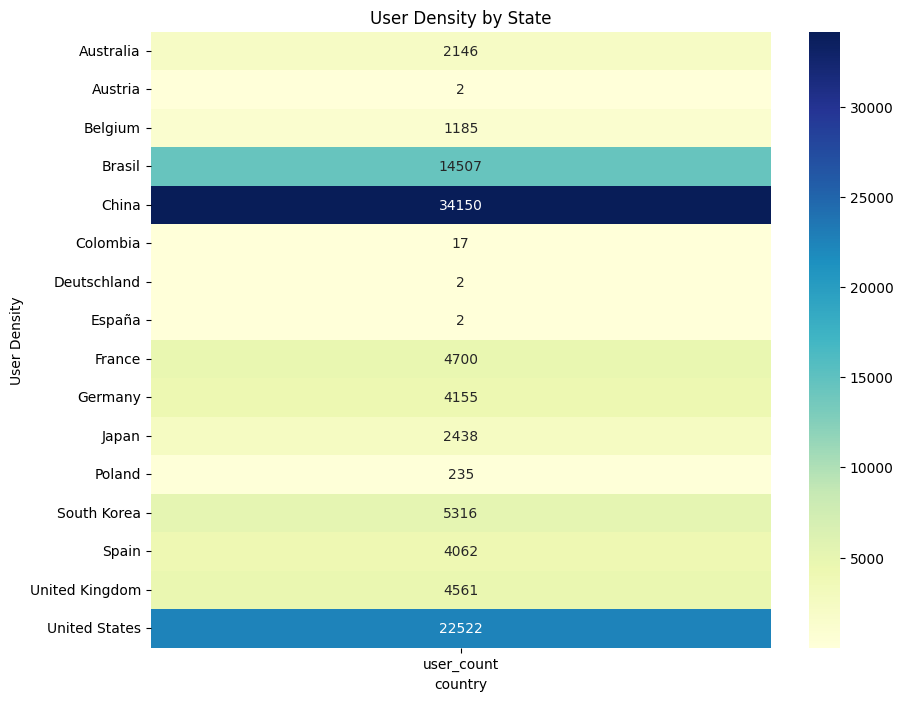

In [988]:
plt.figure(figsize=(10, 8))
sns.heatmap(user_density.pivot_table(index='country', values='user_count', aggfunc='sum'), cmap='YlGnBu', annot=True, fmt='g')
plt.title('User Density by Country')
plt.xlabel('country')
plt.ylabel('User Density')
plt.show()

### Inference:
1. China and USA are the biggest market for our e commerce business.
2. Columbia, Deutschland, Espania are our potential markets and we can grow their substantially.
3. South Korea is an emerging market for us and we can tap the opportunity.

In [ ]:
# SCATTER PLOT USING KMEANS

In [996]:
user_coordinates = users_df[['latitude', 'longitude']]

In [997]:
kmeans = KMeans(n_clusters=8)  
users_df['cluster'] = kmeans.fit_predict(user_coordinates)

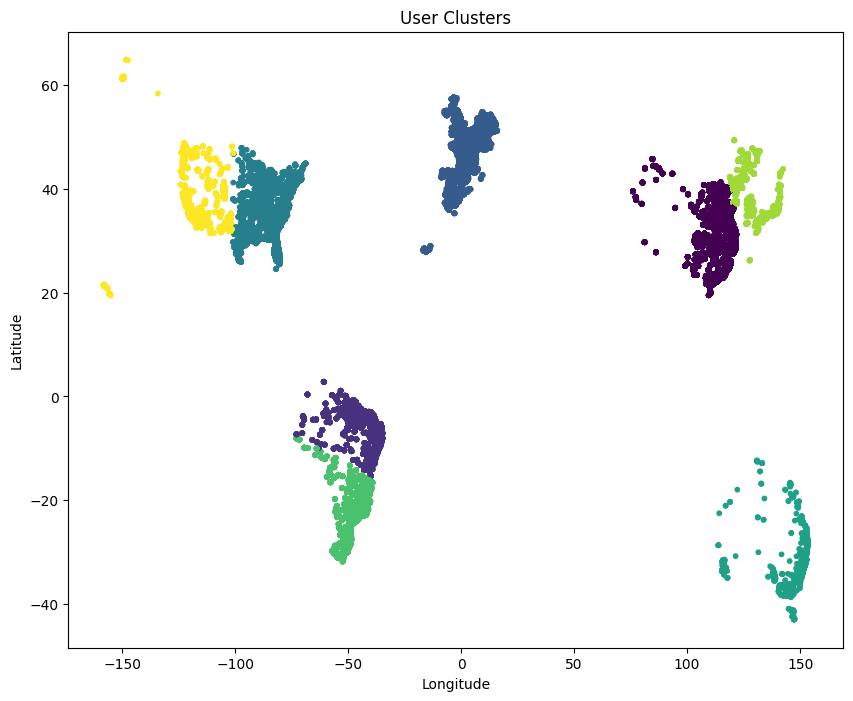

In [998]:
plt.figure(figsize=(10, 8))
plt.scatter(users_df['longitude'], users_df['latitude'], c=users_df['cluster'], cmap='viridis', s=10)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('User Clusters')
plt.show()

### INFERENCE:
We can identify regions with distinct spatial patterns.

To analyze the concentration of users in different regions, i have used heatmaps to visualize user density and did  clustering  to identify spatial patterns.

#### Trying to find distance between users and their nearest Distribution centers

In [999]:
from scipy.spatial.distance import cdist

In [1000]:
user_coordinates = users_df[['latitude', 'longitude']]
distribution_center_coordinates = distribution_centers_df[['latitude', 'longitude']]

In [1006]:
from math import radians, cos, sin, asin, sqrt

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculating the great circle distance between two points
    on the earth specified in decimal degrees
    """
    # Convert decimal degrees to radians
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    r = 6371 
    return c * r

In [1008]:
distances = np.zeros((len(users_df), len(distribution_centers_df)))
for i, user in users_df.iterrows():
    distances[i] = haversine(user['longitude'], user['latitude'],
                             distribution_centers_df['longitude'].values,
                             distribution_centers_df['latitude'].values)
 

In [1009]:
nearest_distribution_center_index = np.argmin(distances, axis=1)

In [1010]:
nearest_distribution_center_distances = np.min(distances, axis=1)

In [1011]:
nearest_distribution_center_distances

array([4875.04189834, 4875.04189834, 4875.04189834, ..., 5896.89144979,
       5896.89144979, 5896.89144979])

### Infrence:
I have found the nearest distribution center for each user and have calculated the distance to it.

Key Points:

- Visualization: Maps are utilized to visualize the spatial distribution of users and distribution centers, providing a clear understanding of their geographic relationship.
- Density Analysis: Heatmaps and clustering techniques helped identify regions with varying user densities, guiding decisions on resource allocation and service expansion.
- Distance Assessment: By calculating distances between users and distribution centers, coverage and accessibility of distribution centers were evaluated, aiding in optimizing logistics and improving service reach.

Overall, these analyses provided valuable insights into the geographic aspects of the dataset, facilitating informed decision-making in areas such as resource allocation, service optimization, and expansion planning.

## User Behaviour Analysis:

In [15]:
warnings.filterwarnings('ignore')

In [16]:
# Load events data into DataFrame
events_df = pd.read_csv('events.csv')

In [17]:
# Explore the data
events_df.head()

,id,user_id,sequence_number,session_id,created_at,ip_address,city,state,postal_code,browser,traffic_source,uri,event_type
0,2198523,NaN,3,83889ed2-2adc-4b9a-af5d-154f6998e778,2021-06-17 17:30:00+00:00,138.143.9.202,São Paulo,São Paulo,02675-031,Chrome,Adwords,/cancel,cancel
1,1773216,NaN,3,7a3fc3f2-e84f-44fe-8876-eff76741f7a3,2020-08-07 08:41:00+00:00,85.114.141.79,Santa Isabel,São Paulo,07500-000,Safari,Adwords,/cancel,cancel
2,2380515,NaN,3,13d9b2fb-eee1-43fd-965c-267b38dd7125,2021-02-15 18:48:00+00:00,169.250.255.132,Mairiporã,São Paulo,07600-000,IE,Adwords,/cancel,cancel
3,2250597,NaN,3,96f1d44e-9621-463c-954c-d8deb7fffe7f,2022-03-30 10:56:00+00:00,137.25.222.160,Cajamar,São Paulo,07750-000,Chrome,Adwords,/cancel,cancel
4,1834446,NaN,3,d09dce10-a7cb-47d3-a9af-44975566fa03,2019-09-05 01:18:00+00:00,161.114.4.174,São Paulo,São Paulo,09581-680,Chrome,Email,/cancel,cancel


### DESCRIPTIVE ANALYSIS

In [18]:
print(events_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2431963 entries, 0 to 2431962
Data columns (total 13 columns):
 #   Column           Dtype  
---  ------           -----  
 0   id               int64  
 1   user_id          float64
 2   sequence_number  int64  
 3   session_id       object 
 4   created_at       object 
 5   ip_address       object 
 6   city             object 
 7   state            object 
 8   postal_code      object 
 9   browser          object 
 10  traffic_source   object 
 11  uri              object 
 12  event_type       object 
dtypes: float64(1), int64(2), object(10)
memory usage: 241.2+ MB
None


In [19]:
nv_df = count_per_null(events_df)
nv_df

,Features,Count_Null,Per_Null
0,user_id,1125671,46.286518
1,city,23080,0.949028


In [20]:
events_df.duplicated().sum()

0

In [21]:
date = events_df['created_at'].value_counts()
date = date[date>1]
date

2020-10-21 16:07:00+00:00    8
2021-10-27 03:05:00+00:00    8
2023-06-21 01:28:00+00:00    8
2019-03-08 16:46:00+00:00    7
2020-05-12 06:36:00+00:00    7
                            ..
2020-04-13 12:27:00+00:00    2
2021-10-04 02:13:00+00:00    2
2019-02-07 01:16:00+00:00    2
2019-06-25 09:16:00+00:00    2
2023-08-31 02:36:00+00:00    2
Name: created_at, Length: 239049, dtype: int64

In [22]:
# multiple events have been created on the same date indicating synergy in their sequence

In [23]:
events_df['created_at'] = pd.to_datetime(events_df['created_at'])
events_df.dtypes

id                               int64
user_id                        float64
sequence_number                  int64
session_id                      object
created_at         datetime64[ns, UTC]
ip_address                      object
city                            object
state                           object
postal_code                     object
browser                         object
traffic_source                  object
uri                             object
event_type                      object
dtype: object

In [24]:
print(events_df['created_at'].min())
print(events_df['created_at'].max())

2019-01-02 00:05:00+00:00
2024-01-21 18:02:23.533893+00:00


In [25]:
d1 = pd.date_range(start='2019-01-02',end='2024-01-21',freq='1D')
print(len(d1))
print(d1)

1846
DatetimeIndex(['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-05',
               '2019-01-06', '2019-01-07', '2019-01-08', '2019-01-09',
               '2019-01-10', '2019-01-11',
               ...
               '2024-01-12', '2024-01-13', '2024-01-14', '2024-01-15',
               '2024-01-16', '2024-01-17', '2024-01-18', '2024-01-19',
               '2024-01-20', '2024-01-21'],
              dtype='datetime64[ns]', length=1846, freq='D')


In [26]:
events_df['Year'] = events_df['created_at'].dt.year
events_df['Quarter'] = events_df['created_at'].dt.quarter
events_df['Month'] = events_df['created_at'].dt.month
events_df['Day'] = events_df['created_at'].dt.day

### EXPLORATORY DATA ANALYSIS

### visualization with respect to time

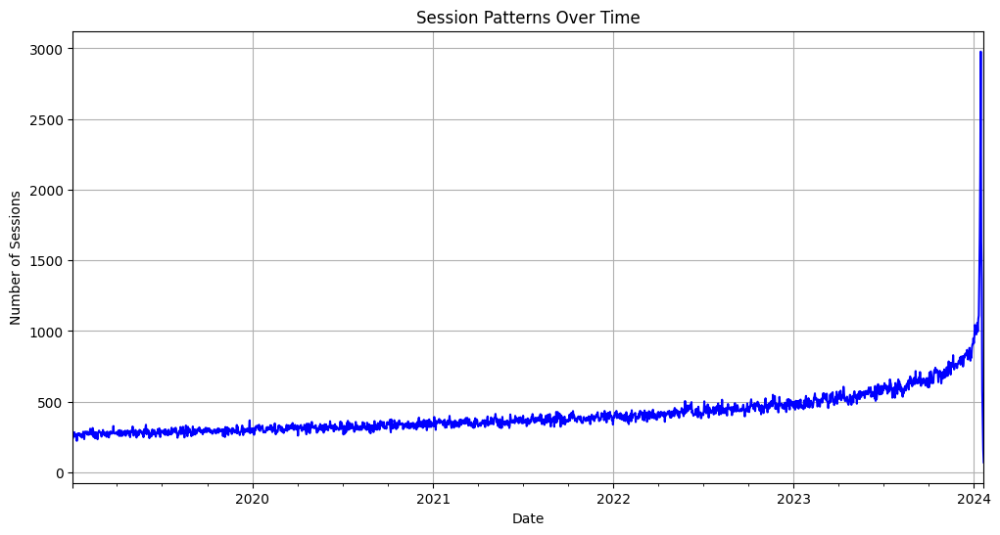

In [28]:
# Set 'created_at' column as the index
DF_EVENTS=events_df.set_index('created_at')

# Resample data by day and count number of sessions/events per day
sessions_per_day = DF_EVENTS['session_id'].resample('D').nunique()

# Plot session patterns over time
plt.figure(figsize=(12, 6))
sessions_per_day.plot(color='blue')
plt.title('Session Patterns Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Sessions')
plt.grid(True)
plt.show()

#### inference:
1. number of unique sessions kept on increasing perday after 2020 but the growth is significant in 2023-2024.
2. no gaps have occured in occurance of events and it has been continuously running.

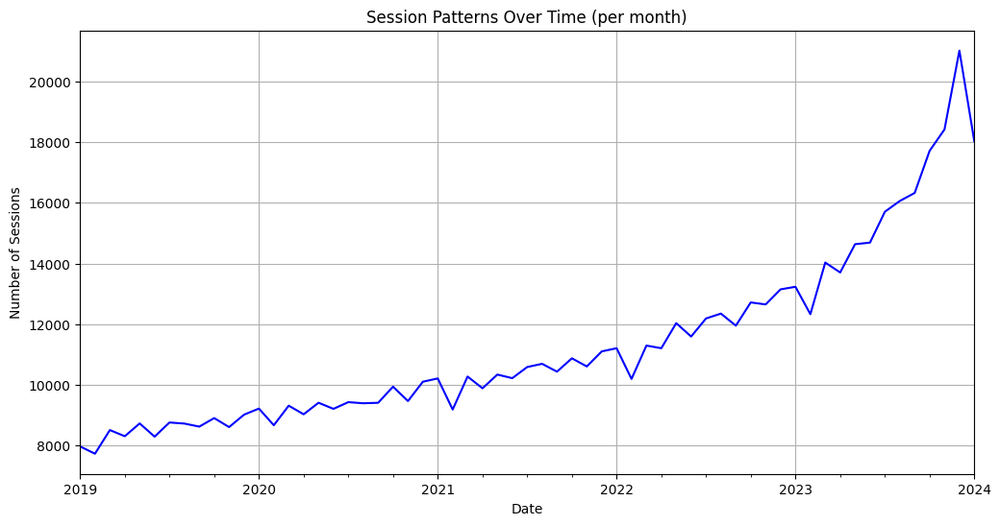

In [31]:
# Resample data by day and count number of sessions/events per month
sessions_per_day = DF_EVENTS['session_id'].resample('M').nunique()

# Plot session patterns over time
plt.figure(figsize=(12, 6))
sessions_per_day.plot(color='blue')
plt.title('Session Patterns Over Time (per month)')
plt.xlabel('Date')
plt.ylabel('Number of Sessions')
plt.grid(True)
plt.show()

#### INFERENCE:
1. Every year their is a significant dip in number of unique sessions in first quarter(January to March)
2. From 2023-2024 exponential hike in unique sessions have been observed after first quarter.

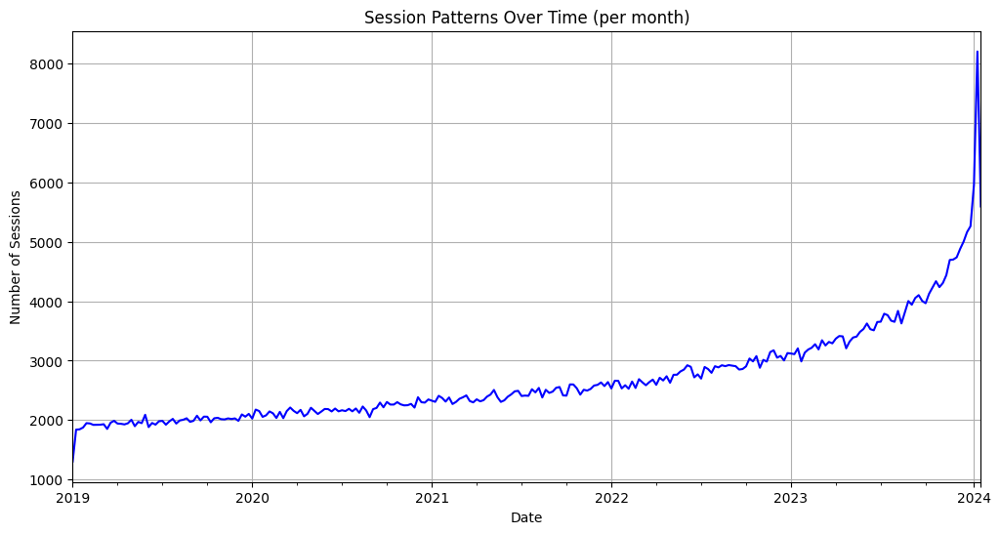

In [33]:
# Resample data by day and count number of sessions/events per week
sessions_per_day = DF_EVENTS['session_id'].resample('W').nunique()

# Plot session patterns over time
plt.figure(figsize=(12, 6))
sessions_per_day.plot(color='blue')
plt.title('Session Patterns Over Time (per month)')
plt.xlabel('Date')
plt.ylabel('Number of Sessions')
plt.grid(True)
plt.show()

#### Inference:
in late 2023 and starting 2024 the weekly sessions have shown constant and sharp increase

In [35]:
events_df['event_type'].value_counts()

product       845607
cart          595994
department    595323
purchase      181759
cancel        125568
home           87712
Name: event_type, dtype: int64

In [38]:
events_df['traffic_source'].value_counts()

Email       1091988
Adwords      731144
Facebook     243834
YouTube      242938
Organic      122059
Name: traffic_source, dtype: int64

In [39]:
events_df['state'].value_counts()

Guangdong     129796
England        99365
California     89515
Shanghai       59276
Texas          58816
               ...  
Shiga             44
Shimane           44
Nara              28
Yamanashi         13
Mie                9
Name: state, Length: 231, dtype: int64

In [40]:
events_df['city'].value_counts()

Shanghai       60561
Beijing        53095
Seoul          35860
Shenzhen       32723
Dongguan       23024
               ...  
Ningi              1
Nanga Brook        1
Blairmount         1
Nagambie           1
Modave             1
Name: city, Length: 8775, dtype: int64

In [41]:
events_df['uri'].value_counts()

/cart                                                                  595994
/purchase                                                              181759
/cancel                                                                125568
/home                                                                   87712
/department/women/category/maternity/brand/motherhoodmaternity           3354
                                                                        ...  
/department/women/category/fashionhoodies&sweatshirts/brand/citizen         6
/department/women/category/tops&tees/brand/blackmarket-lowbrow              6
/product/11264                                                              6
/department/men/category/outerwear&coats/brand/toesonthenose                5
/department/women/category/sweaters/brand/hotfromhollywood                  3
Name: uri, Length: 35530, dtype: int64

In [42]:
events_df['browser'].value_counts()

Chrome     1218687
Firefox     487490
Safari      483743
IE          121551
Other       120492
Name: browser, dtype: int64

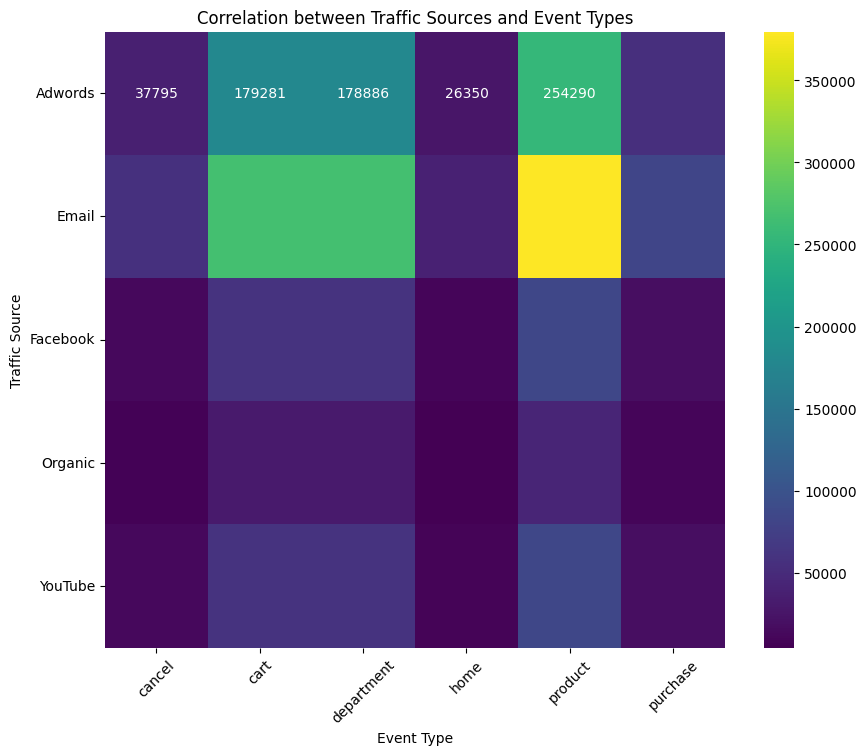

In [64]:
contingency_table = pd.crosstab(events_df['traffic_source'], events_df['event_type'])

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(contingency_table, annot=True, fmt='d', cmap='viridis')
plt.title('Correlation between Traffic Sources and Event Types')
plt.xlabel('Event Type')
plt.ylabel('Traffic Source')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

#### Inference
1. purchase is highly likely to be cancelled traffic source is organic
2. Emails are great source for luring customers directly to access products but the correlation shows that purchase rate through emails are less, this should be handled well as potential customers who are liking the product are not buying them for some reason.

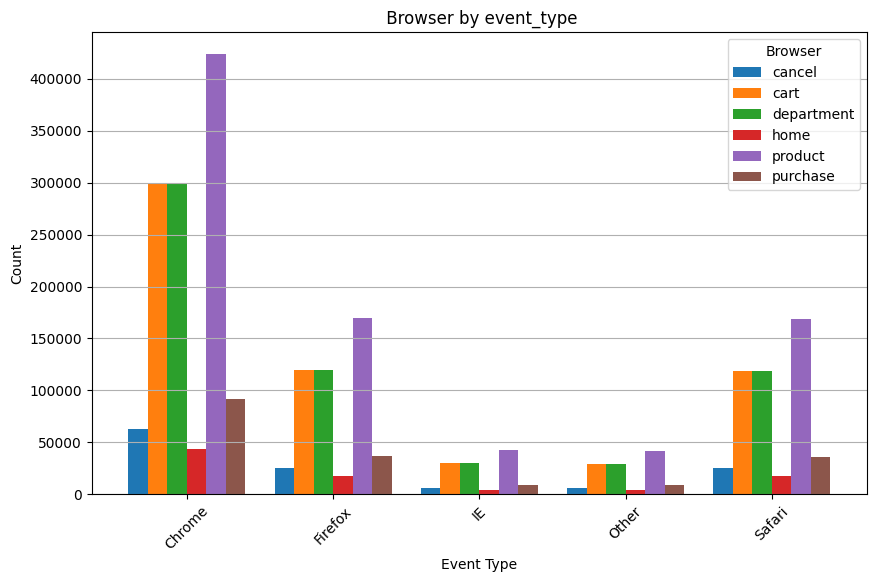

In [52]:
grouped_data = events_df.groupby(['browser','event_type']).size().unstack()

# Plotting clustered bar chart
grouped_data.plot(kind='bar', figsize=(10, 6), width=0.8)
plt.title(' Browser by event_type')
plt.xlabel('Browser')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Event_type')
plt.grid(axis='y')
plt.show()

### inference:
1. maximum users use chrome browser to access the website
2. the number of users reaching the department section are likely to reach to the desired product butdo not add product in the cart so coupons can be used on products or products can be platform assured or reviews should be good for the products to sell.
3. least number of users are accessing website using Internet Explorer and other mediums.

In [55]:
events_df['sequence_number'].value_counts()

1     681759
2     557043
3     432146
4     181759
5     181759
6      94047
7      94047
9      44313
10     44313
8      44313
12     25488
11     25488
13     25488
Name: sequence_number, dtype: int64

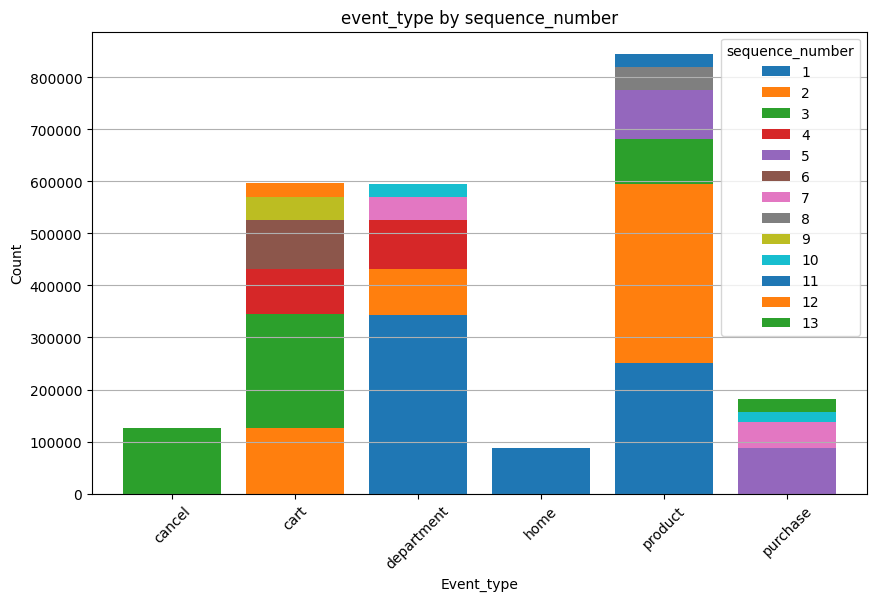

In [57]:
grouped_data = events_df.groupby(['event_type','sequence_number']).size().unstack()

# Plotting stacked bar chart
grouped_data.plot(kind='bar', figsize=(10, 6), width=0.8, stacked=True,sort_columns=True)
plt.title('event_type by sequence_number')
plt.xlabel('Event_type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='sequence_number')
plt.grid(axis='y')
plt.show()

In [65]:
# Sorting the DataFrame by 'user_id' and 'created_at'
events_dfcopy=events_df.sort_values(by=['user_id', 'created_at'])

# Calculatimg the time difference between consecutive rows for each user
events_dfcopy['time_diff'] = events_dfcopy.groupby('user_id')['created_at'].diff()

# Filling missing values with 0, indicating the start of a new session
events_dfcopy['time_diff'].fillna(pd.Timedelta(seconds=0), inplace=True)

# Calculating total duration per user by summing the time differences
total_duration_per_user = events_dfcopy.groupby('user_id')['time_diff'].sum()

# Converting total duration to seconds or any other appropriate unit
total_duration_per_user = total_duration_per_user.dt.total_seconds()

# Adding 'total_duration' as a feature to the users_df DataFrame
users_df['total_duration'] = total_duration_per_user

In [79]:
total_duration_per_user

user_id
1.0           175666.0
2.0              434.0
3.0         13043069.0
4.0              308.0
5.0           348876.0
               ...    
99993.0          240.0
99996.0     82521870.0
99998.0     18830818.0
99999.0        96093.0
100000.0    30849932.0
Name: time_diff, Length: 80044, dtype: float64

In [87]:
users_df['total_duration'].isnull().sum()

19957

In [92]:
users_df.dropna(inplace=True)


In [93]:
users_df.isnull().sum()

id                        0
first_name                0
last_name                 0
email                     0
age                       0
gender                    0
state                     0
street_address            0
postal_code               0
city                      0
country                   0
latitude                  0
longitude                 0
traffic_source            0
created_at                0
total_duration            0
session_count_per_user    0
event_type_count          0
dtype: int64

In [69]:
# Count the number of sessions for each user
session_count_per_user = events_df.groupby('user_id')['session_id'].nunique()

In [70]:
print(session_count_per_user)

user_id
1.0         3
2.0         1
3.0         5
4.0         1
5.0         3
           ..
99993.0     1
99996.0     4
99998.0     3
99999.0     2
100000.0    2
Name: session_id, Length: 80044, dtype: int64


In [71]:
# Adding 'session count per user' as a feature to the users_df DataFrame
users_df['session_count_per_user'] = session_count_per_user

In [94]:
users_df['session_count_per_user'].isnull().sum()

0

#### event_type_count is a feature that represents the count of unique event types performed by each user.
#### It encapsulates the diversity of actions or behaviors exhibited by users during their interactions with the system.

In [75]:
# event_type_count is a feature that represents the count of unique event types performed by each user.
# It encapsulates the diversity of actions or behaviors exhibited by users during their interactions with the system.

event_type_count_per_user = events_df.groupby('user_id')['event_type'].nunique()
event_type_count_per_user

user_id
1.0         4
2.0         5
3.0         5
4.0         5
5.0         4
           ..
99993.0     5
99996.0     4
99998.0     5
99999.0     4
100000.0    5
Name: event_type, Length: 80044, dtype: int64

In [76]:
# Adding 'event_type_count' as a feature to the users_df DataFrame
users_df['event_type_count'] = event_type_count_per_user

In [95]:
users_df['event_type_count'].isnull().sum()

0

### MODEL BUILDING- kmeans Clustering

In [99]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

behavioral_features = ['session_count_per_user', 'total_duration', 'event_type_count']

In [100]:
# Normalize features
scaler = StandardScaler()
users_df_scaled = scaler.fit_transform(users_df[behavioral_features])

In [115]:
users_df[behavioral_features]

,session_count_per_user,total_duration,event_type_count
1,3.0,175666.0,4.0
2,1.0,434.0,5.0
3,5.0,13043069.0,5.0
4,1.0,308.0,5.0
5,3.0,348876.0,4.0
...,...,...,...
99992,3.0,261072.0,4.0
99993,1.0,240.0,5.0
99996,4.0,82521870.0,4.0
99998,3.0,18830818.0,5.0


In [116]:
users_df_scaled = pd.DataFrame(users_df_scaled, columns=users_df[behavioral_features].columns)

In [117]:
# within cluster sum of square
wcss = []
for i in range(1,15):
    model = KMeans(n_clusters=i)
    model.fit(users_df_scaled)
    wcss.append(model.inertia_)
    
# model.inertia_ returns the WCSS values
print('WCSS\n',wcss)

WCSS
 [237815.99999999919, 148739.61525357916, 69977.32816609702, 49190.65394204521, 37311.477944353814, 31589.455452935028, 26011.442077579613, 21768.33338332047, 19295.88235891772, 17053.16515162889, 14935.143325757403, 13430.380146654441, 12249.573118508137, 11251.75713581292]


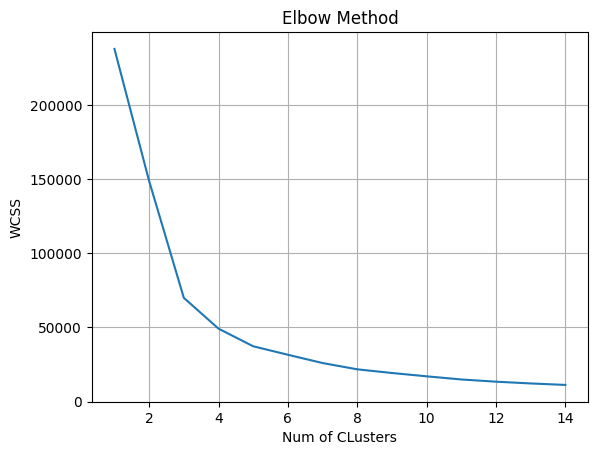

In [118]:
plt.plot(list(range(1,15)),wcss)
plt.title('Elbow Method')
plt.xlabel('Num of CLusters')
plt.ylabel('WCSS')
plt.grid()
plt.show()

In [ ]:
# optimum number of clusters are 3 or 4

In [119]:
kmeans = KMeans(n_clusters=3, random_state=0)
cluster_labels = kmeans.fit_predict(users_df_scaled)

In [120]:
cluster_labels

array([2, 0, 1, ..., 1, 0, 2])

In [107]:
from collections import Counter

In [121]:
c = Counter(cluster_labels)
print(c)

Counter({0: 46943, 2: 16206, 1: 16123})


In [122]:
def K_cluster_analysis(k,table):
    model = KMeans(n_clusters=k,random_state=0)
    model.fit(table)
    ypred = model.predict(table)
    print(Counter(ypred))
    cent = model.cluster_centers_
    table[f'Cls{k}'] = ypred
    r1 = table.drop(f'Cls{k}',axis=1).mean().reset_index().T
    r1.columns = r1.loc['index']
    r1 = r1.iloc[1:,]
    r1.index = ['Mean']
    r2 = table.groupby(f'Cls{k}').mean()
    cls_analysis = pd.concat([r1,r2]).T
    return cls_analysis

In [123]:
K_cluster_analysis(3,users_df_scaled)

Counter({0: 46943, 2: 16206, 1: 16123})


,Mean,0,1,2
session_count_per_user,-0.0,-0.548901,1.303127,0.293516
total_duration,0.0,-0.382103,1.5456,-0.430868
event_type_count,-0.0,0.516087,0.445015,-1.937657


In [124]:
cluster_counts = users_df_scaled['Cls3'].value_counts()

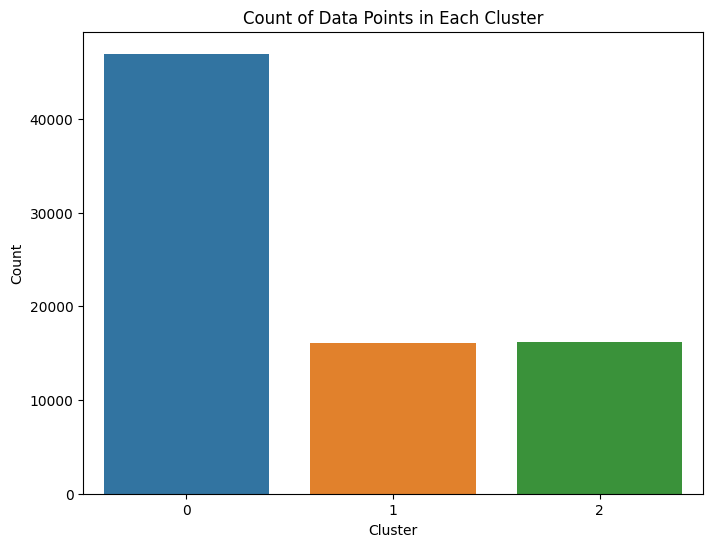

In [125]:
plt.figure(figsize=(8, 6))
sns.barplot(x=cluster_counts.index, y=cluster_counts.values)
plt.title('Count of Data Points in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')

# Show the plot
plt.show()

### Key Points:
- Session Patterns Analysis: Visualized session patterns over time using line plots to understand trends and fluctuations in user activity. This visualization provided insights into how user activity varies over days, weeks, or months, allowing us to identify patterns such as daily or weekly peaks, seasonal trends, or changes in user behavior over time. 
- Traffic Sources Analysis: Analysed correlation between traffic source and event type using heatmap. AllowIing us to easily identify which traffic sources associated with certain event types more frequently, helping us understand user behavior patterns and the effectiveness of different traffic sources in driving specific actions
- Event Types - Frequency Analysis: Examined the frequency and distribution of each event type to understand user engagement patterns and preferences.

I have applied Kmeans clustering to group users based on their behavior patterns.

# SALES AND REVENUE ANALYSIS

### reading the dataset

In [374]:
order_items_df = pd.read_csv('order_items.csv')
inventory_items_df = pd.read_csv('inventory_items.csv')

In [375]:
order_items_df.shape

(181759, 11)

In [376]:
inventory_items_df.shape

(490705, 12)

In [377]:
order_items_df.head(1)

,id,order_id,user_id,product_id,inventory_item_id,status,created_at,shipped_at,delivered_at,returned_at,sale_price
0,152013,104663,83582,14235,410368,Cancelled,2023-05-07 06:08:40+00:00,NaN,NaN,NaN,0.02


In [378]:
inventory_items_df.head(1)

,id,product_id,created_at,sold_at,cost,product_category,product_name,product_brand,product_retail_price,product_department,product_sku,product_distribution_center_id
0,67971,13844,2022-07-02 07:09:20+00:00,2022-07-24 06:33:20+00:00,2.76804,Accessories,(ONE) 1 Satin Headband,Funny Girl Designs,6.99,Women,2A3E953A5E3D81E67945BCE5519F84C8,7


## DATA preprocessing

In [379]:
# null value handling
order_items_df.isnull().sum()

id                        0
order_id                  0
user_id                   0
product_id                0
inventory_item_id         0
status                    0
created_at                0
shipped_at            63478
delivered_at         117918
returned_at          163527
sale_price                0
dtype: int64

In [380]:
nv_df = count_per_null(order_items_df)
nv_df

,Features,Count_Null,Per_Null
2,returned_at,163527,89.969135
1,delivered_at,117918,64.876017
0,shipped_at,63478,34.924268


In [381]:
order_items_df.drop(["returned_at",'delivered_at'],axis=1,inplace=True)
#percentage of null values is too high

In [382]:
order_items_df.isnull().sum()

id                       0
order_id                 0
user_id                  0
product_id               0
inventory_item_id        0
status                   0
created_at               0
shipped_at           63478
sale_price               0
dtype: int64

In [383]:
order_items_df.dtypes

id                     int64
order_id               int64
user_id                int64
product_id             int64
inventory_item_id      int64
status                object
created_at            object
shipped_at            object
sale_price           float64
dtype: object

In [384]:
order_items_df['shipped_at'].value_counts()

2023-12-26 19:56:00+00:00    9
2024-01-08 13:33:00+00:00    8
2023-03-05 07:51:00+00:00    8
2023-12-23 15:13:00+00:00    8
2021-10-16 17:42:00+00:00    8
                            ..
2022-06-08 01:34:00+00:00    1
2023-01-23 11:33:00+00:00    1
2023-12-28 12:46:00+00:00    1
2023-02-14 19:47:00+00:00    1
2022-03-14 01:27:00+00:00    1
Name: shipped_at, Length: 79123, dtype: int64

In [385]:
# lot many time based data is missing which can not be replaced there fore i am dropping the column

In [386]:
order_items_df.drop(["shipped_at"],axis=1,inplace=True)
order_items_df.isnull().sum()

id                   0
order_id             0
user_id              0
product_id           0
inventory_item_id    0
status               0
created_at           0
sale_price           0
dtype: int64

In [387]:
inventory_items_df.isnull().sum()

id                                     0
product_id                             0
created_at                             0
sold_at                           308946
cost                                   0
product_category                       0
product_name                          29
product_brand                        401
product_retail_price                   0
product_department                     0
product_sku                            0
product_distribution_center_id         0
dtype: int64

In [388]:
inventory_items_df.drop('sold_at',axis=1,inplace=True)

In [389]:
inventory_items_df.dropna(inplace=True)

In [390]:
inventory_items_df.isnull().sum()

id                                0
product_id                        0
created_at                        0
cost                              0
product_category                  0
product_name                      0
product_brand                     0
product_retail_price              0
product_department                0
product_sku                       0
product_distribution_center_id    0
dtype: int64

In [394]:
#checking duplicates

In [392]:
order_items_df.duplicated().sum()

0

In [393]:
inventory_items_df.duplicated().sum()

0

## Exploratory data analysis

In [396]:
# Counting the number of occurrences of each order_id
order_quantity = order_items_df['order_id'].value_counts()
order_quantity

551       4
70304     4
106023    4
106407    4
93518     4
         ..
21230     1
21000     1
20626     1
20230     1
98984     1
Name: order_id, Length: 125226, dtype: int64

##### it is the quantity delivered in each order which may consist of several different products.

In [397]:
# Grouping order_id and counting the number of unique order item IDs attached to them
quantity_per_order = order_items_df.groupby('order_id')['id'].count()

# Display quantity per order
quantity_per_order

order_id
1         3
2         1
3         1
4         1
5         1
         ..
125222    1
125223    1
125224    2
125225    1
125226    1
Name: id, Length: 125226, dtype: int64

In [398]:
order_items_df = pd.merge(order_items_df, quantity_per_order, left_on='order_id', right_index=True, suffixes=('', '_count'))
order_items_df.rename(columns={'order_id_count': 'quantity'}, inplace=True)

# Displaying the updated DataFrame with total quantity sold in each order
(order_items_df).head()

,id,order_id,user_id,product_id,inventory_item_id,status,created_at,sale_price,id_count
0,152013,104663,83582,14235,410368,Cancelled,2023-05-07 06:08:40+00:00,0.02,1
1,40993,28204,22551,14235,110590,Complete,2023-03-14 03:47:21+00:00,0.02,1
2,51224,35223,28215,14235,138236,Complete,2023-12-05 13:25:30+00:00,0.02,4
24869,51226,35223,28215,10641,138242,Complete,2023-12-06 10:12:51+00:00,16.00,4
34158,51227,35223,28215,5268,138245,Complete,2023-12-07 10:02:18+00:00,19.99,4


In [448]:
order_items_df['status'].value_counts()

Shipped       54440
Complete      45609
Processing    36388
Cancelled     27090
Returned      18232
Name: status, dtype: int64

In [451]:
#CANCELLATION RATE
status_count=order_items_df['status'].value_counts().reset_index()
status_count

,index,status
0,Shipped,54440
1,Complete,45609
2,Processing,36388
3,Cancelled,27090
4,Returned,18232


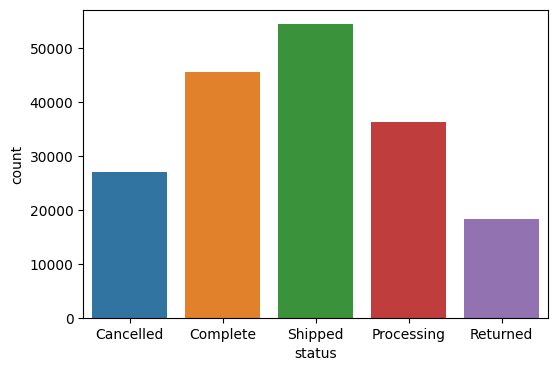

In [457]:
plt.figure(figsize=(6,4))
sns.countplot(x=order_items_df['status'])
plt.show()

In [458]:
order_items_df['status'].describe()

count      181759
unique          5
top       Shipped
freq        54440
Name: status, dtype: object

In [399]:
# order_items_df.drop('id_count',axis=1,inplace=True)

In [400]:
(order_items_df).shape

(181759, 9)

In [401]:
order_items_df['Quantity_sold']=order_items_df['id_count']


In [402]:
order_items_df.head(1)

,id,order_id,user_id,product_id,inventory_item_id,status,created_at,sale_price,id_count,Quantity_sold
0,152013,104663,83582,14235,410368,Cancelled,2023-05-07 06:08:40+00:00,0.02,1,1


In [403]:
order_items_df.drop('id_count',axis=1,inplace=True)

In [404]:
order_items_df.head(1)

,id,order_id,user_id,product_id,inventory_item_id,status,created_at,sale_price,Quantity_sold
0,152013,104663,83582,14235,410368,Cancelled,2023-05-07 06:08:40+00:00,0.02,1


In [407]:
inventory_items_df['inventory_item_id']=inventory_items_df['id']
inventory_items_df.drop("id",axis=1,inplace=True)
inventory_items_df.head(1)

,product_id,created_at,cost,product_category,product_name,product_brand,product_retail_price,product_department,product_sku,product_distribution_center_id,inventory_item_id
0,13844,2022-07-02 07:09:20+00:00,2.76804,Accessories,(ONE) 1 Satin Headband,Funny Girl Designs,6.99,Women,2A3E953A5E3D81E67945BCE5519F84C8,7,67971


In [408]:
merged_df = pd.merge(order_items_df, inventory_items_df, how='inner', on='inventory_item_id')

#### one order_id is associated with multiple products that means we have to find the total sale price of each order_id by summing up sale price of its products.

In [409]:
merged_df

,id,order_id,user_id,product_id_x,inventory_item_id,status,created_at_x,sale_price,Quantity_sold,product_id_y,created_at_y,cost,product_category,product_name,product_brand,product_retail_price,product_department,product_sku,product_distribution_center_id
0,152013,104663,83582,14235,410368,Cancelled,2023-05-07 06:08:40+00:00,0.02,1,14235,2021-09-09 06:17:00+00:00,0.008300,Accessories,Indestructable Aluminum Aluma Wallet - RED,marshal,0.02,Women,8425BC94A44E3D1BB3C8C026B2702C00,1
1,40993,28204,22551,14235,110590,Complete,2023-03-14 03:47:21+00:00,0.02,1,14235,2023-06-05 15:24:00+00:00,0.008300,Accessories,Indestructable Aluminum Aluma Wallet - RED,marshal,0.02,Women,8425BC94A44E3D1BB3C8C026B2702C00,1
2,51224,35223,28215,14235,138236,Complete,2023-12-05 13:25:30+00:00,0.02,4,14235,2020-04-12 14:36:00+00:00,0.008300,Accessories,Indestructable Aluminum Aluma Wallet - RED,marshal,0.02,Women,8425BC94A44E3D1BB3C8C026B2702C00,1
3,51226,35223,28215,10641,138242,Complete,2023-12-06 10:12:51+00:00,16.00,4,10641,2021-12-29 00:16:00+00:00,7.968000,Intimates,Maidenform Womens Dream Front Close Lace T-Bac...,Maidenform,16.00,Women,C95D62C68196B2D0C1C1DE8C7EEB6D50,9
4,51227,35223,28215,5268,138245,Complete,2023-12-07 10:02:18+00:00,19.99,4,5268,2020-04-09 17:52:00+00:00,11.314340,Pants & Capris,Wearables womens ruffle pocket capri pants,Wearables,19.99,Women,02A3C7FB3F489288AE6942498498DB20,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181595,37188,25610,20434,24447,100325,Complete,2023-06-15 11:58:18+00:00,999.00,1,24447,2021-07-01 04:12:00+00:00,404.595001,Outerwear & Coats,Darla,Alpha Industries,999.00,Men,1CE5E897CDA6AEB211DFFE8D514F4365,5
181596,41201,28344,22656,23546,111165,Complete,2023-06-17 15:30:18+00:00,999.00,1,23546,2022-04-14 01:20:00+00:00,482.516999,Shorts,Alpha Industries Rip Stop Short,Alpha Industries,999.00,Men,C1AA157F9E8516370E3345F226EF62FC,5
181597,9674,6679,5325,24447,26095,Returned,2020-12-23 00:05:01+00:00,999.00,1,24447,2021-10-07 09:37:00+00:00,404.595001,Outerwear & Coats,Darla,Alpha Industries,999.00,Men,1CE5E897CDA6AEB211DFFE8D514F4365,5
181598,106577,73418,58623,24447,287560,Shipped,2023-11-12 02:41:02+00:00,999.00,1,24447,2022-11-04 09:27:00+00:00,404.595001,Outerwear & Coats,Darla,Alpha Industries,999.00,Men,1CE5E897CDA6AEB211DFFE8D514F4365,5


In [410]:
merged_df.shape

(181600, 19)

In [411]:
to_drop=merged_df[merged_df['created_at_y']>merged_df['created_at_x']]

In [412]:
to_drop.head(2)

,id,order_id,user_id,product_id_x,inventory_item_id,status,created_at_x,sale_price,Quantity_sold,product_id_y,created_at_y,cost,product_category,product_name,product_brand,product_retail_price,product_department,product_sku,product_distribution_center_id
1,40993,28204,22551,14235,110590,Complete,2023-03-14 03:47:21+00:00,0.02,1,14235,2023-06-05 15:24:00+00:00,0.0083,Accessories,Indestructable Aluminum Aluma Wallet - RED,marshal,0.02,Women,8425BC94A44E3D1BB3C8C026B2702C00,1
10,131061,90241,71954,14235,353798,Shipped,2022-06-19 16:57:59+00:00,0.02,3,14235,2022-09-13 16:58:00+00:00,0.0083,Accessories,Indestructable Aluminum Aluma Wallet - RED,marshal,0.02,Women,8425BC94A44E3D1BB3C8C026B2702C00,1


In [413]:
# i am letting go rows where inventory created date for the product is greater than the order creation date in the merged dataset.

In [414]:
merged_df=merged_df[merged_df['created_at_y']<merged_df['created_at_x']]

In [415]:
merged_df.shape

(126508, 19)

In [416]:
vc=order_items_df.groupby('order_id')['product_id'].value_counts()
vc

order_id  product_id
1         2953          1
          4731          1
          7656          1
2         25774         1
3         22308         1
                       ..
125223    21923         1
125224    20828         1
          25959         1
125225    10743         1
125226    10017         1
Name: product_id, Length: 181752, dtype: int64

In [420]:
vc[vc>1]

order_id  product_id
11820     21845         2
26696     4310          2
59279     1215          2
62202     19828         2
88827     2996          2
94181     22919         2
98109     1054          2
Name: product_id, dtype: int64

In [421]:
vc.shape

(181752,)

In [422]:
type(vc)

pandas.core.series.Series

In [423]:
merged_df[['product_id_x','product_id_y']]

,product_id_x,product_id_y
0,14235,14235
2,14235,14235
3,10641,10641
4,5268,5268
5,13268,13268
...,...,...
181591,24341,24341
181593,24341,24341
181595,24447,24447
181596,23546,23546


### Calculate sales metrics - inventory based

In [426]:
merged_df['Total sales per inventory']=merged_df.groupby('inventory_item_id')['sale_price'].sum()
merged_df['Total cost per inventory']=merged_df.groupby('inventory_item_id')['cost'].sum()

In [427]:
merged_df['profit per inventory'] = merged_df['Total sales per inventory'] - merged_df['Total cost per inventory']
#total sales of each inventory

In [428]:
# Total sales and revenue
total_inventory_sales = merged_df['Total sales per inventory'].sum()
total_revenue_on_inventory = merged_df['Total sales per inventory'].sum() - merged_df['Total cost per inventory'].sum()

In [429]:
# Sales performance by product category
sales_by_category = merged_df.groupby('product_category')['Total sales per inventory'].sum()

In [430]:
sales_by_category.sort_values(ascending=False)

product_category
Intimates                        138665.270205
Jeans                            135606.260201
Fashion Hoodies & Sweatshirts    128664.450185
Tops & Tees                      127637.400162
Swim                             124991.430146
Sweaters                         123913.120013
Shorts                           115789.820119
Sleep & Lounge                   115156.080103
Accessories                      107538.570120
Active                           100965.010149
Outerwear & Coats                100342.560084
Pants                             83186.810086
Underwear                         78636.340151
Socks                             69056.220063
Dresses                           64864.620063
Maternity                         56501.440058
Suits & Sport Coats               56439.380101
Plus                              46274.060091
Socks & Hosiery                   41737.289980
Leggings                          33157.259986
Pants & Capris                    32891.600

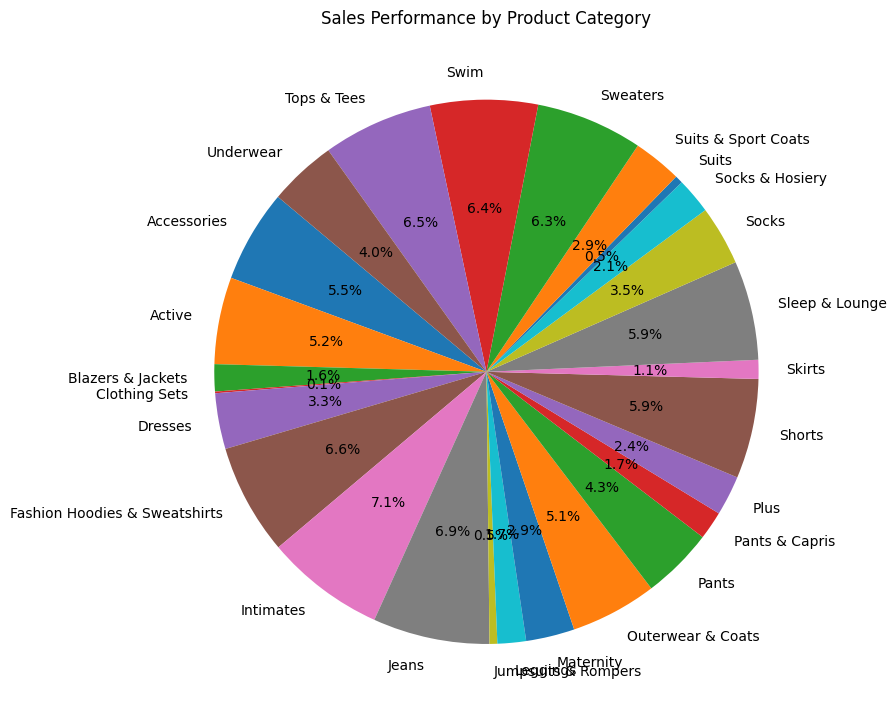

In [431]:
# Plotting a pie chart
plt.figure(figsize=(9, 9))
sales_by_category.plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Sales Performance by Product Category')

plt.tight_layout()
plt.show()

### Inference:
1. 'Intimates' product category has shown highest sales from the available inventory.
2. 'Clothing sets' are least sales generating category.

In [432]:
# Sales performance by brand
sales_by_brand = merged_df.groupby('product_brand')['Total sales per inventory'].sum()

In [433]:
sales_by_brand.sort_values(ascending=False)

product_brand
Allegra K         65770.710014
Calvin Klein      35616.090024
Carhartt          31497.350104
Tommy Hilfiger    20874.229986
Volcom            20798.039998
                      ...     
Carraig Donn          0.000000
Star Ride             0.000000
Lingerie              0.000000
Atti Fashion          0.000000
Bosca                 0.000000
Name: Total sales per inventory, Length: 2742, dtype: float64

### Inference:
1. The brand ALLEGRA K shows highest sales from the inventory.
2. Many brands even showed 0 sales and company might want to discontinue them or promote their sales througgh promotions.

In [434]:
# Sales performance by distribution center
sales_by_dist_center = merged_df.groupby('product_distribution_center_id')['Total sales per inventory'].sum()
sales_by_dist_center

product_distribution_center_id
1     261152.940363
2     260981.870200
3     241357.490391
4     186565.330221
5     139923.840224
6     169109.430182
7     184815.580187
8     199917.390160
9     185442.730247
10    126234.670051
Name: Total sales per inventory, dtype: float64

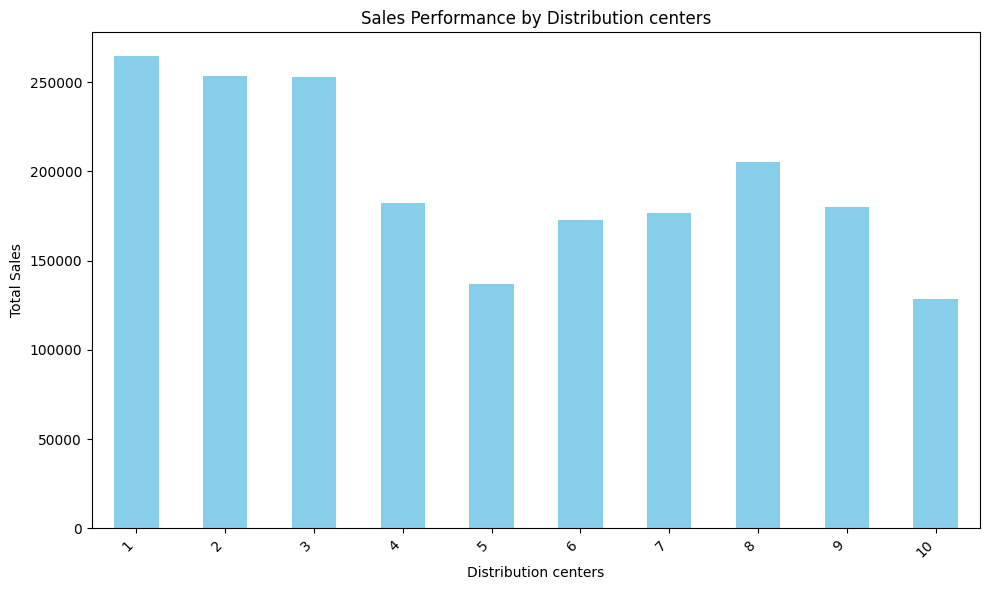

In [334]:
# Plotting a bar plot
plt.figure(figsize=(10, 6))
sales_by_dist_center.plot(kind='bar', color='skyblue')
plt.title('Sales Performance by Distribution centers')
plt.xlabel('Distribution centers')
plt.ylabel('Total Sales')
plt.xticks(rotation=45, ha='right')  
plt.tight_layout()
plt.show()

### inferences:
1) Distribution centre number 1 offers maimum inventory sales
2) center no. 5 show the least sales

###  Visualising sales trends over time


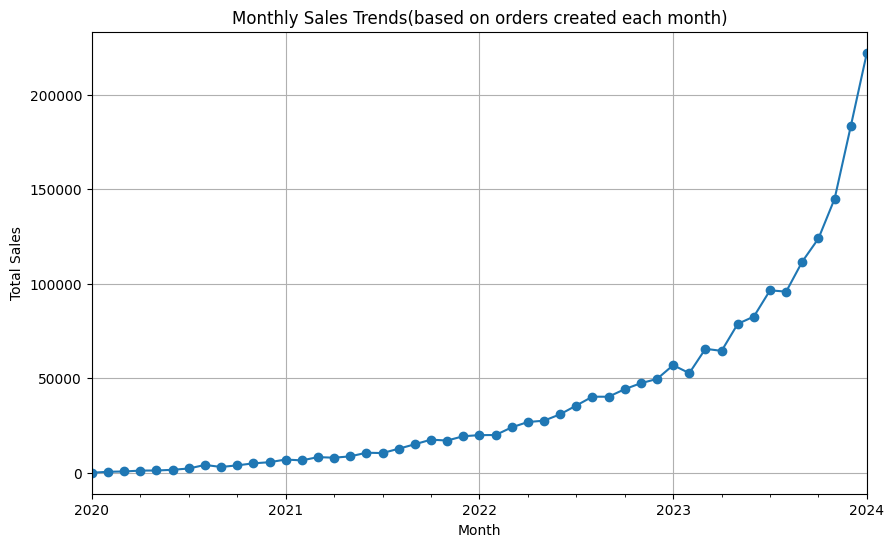

In [437]:
merged_df['created_at_x'] = pd.to_datetime(merged_df['created_at_x'])
monthly_sales = merged_df.resample('M', on='created_at_x')['Total sales per inventory'].sum()

# Ploting sales trends
monthly_sales.plot(kind='line', figsize=(10, 6), marker='o')
plt.title('Monthly Sales Trends(based on orders created each month)')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.grid(True)
plt.show()

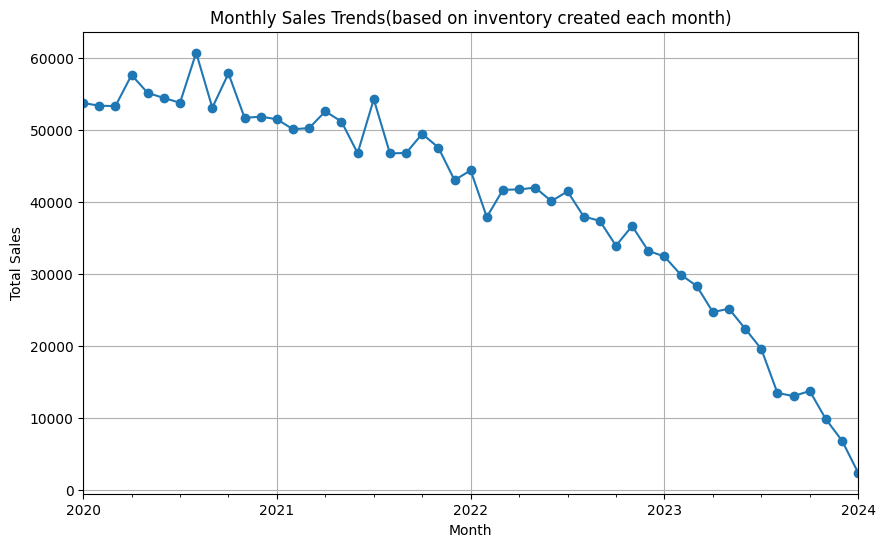

In [438]:
merged_df['created_at_y'] = pd.to_datetime(merged_df['created_at_y'])
monthly_sales = merged_df.resample('M', on='created_at_y')['Total sales per inventory'].sum()

# Ploting sales trends
monthly_sales.plot(kind='line', figsize=(10, 6), marker='o')
plt.title('Monthly Sales Trends(based on inventory created each month)')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.grid(True)
plt.show()

### infrence:
1. based on inventory creation the trend shows decline in total sales from inventries with respect to time.
2. based on orders creation the sales trend from each inventory do show a steady increase till 2020 and later on it shows good exponential increase.

In [441]:
# Analysing profit with respect to product category
profit_by_category = merged_df.groupby('product_category')['profit per inventory'].sum()
profit_by_category.sort_values()

product_category
Clothing Sets                     1028.449118
Suits                             4619.487547
Jumpsuits & Rompers               4723.612735
Skirts                           11321.927597
Blazers & Jackets                16199.436738
Pants & Capris                   16959.989888
Leggings                         17203.392439
Socks & Hosiery                  21575.045847
Plus                             23894.288111
Maternity                        29281.311898
Suits & Sport Coats              29455.806952
Dresses                          33593.196866
Socks                            35707.015246
Underwear                        40674.341029
Pants                            43165.448200
Outerwear & Coats                51994.116137
Active                           52756.092076
Accessories                      55864.279906
Sleep & Lounge                   59789.000844
Shorts                           59993.616024
Sweaters                         64328.580252
Swim             

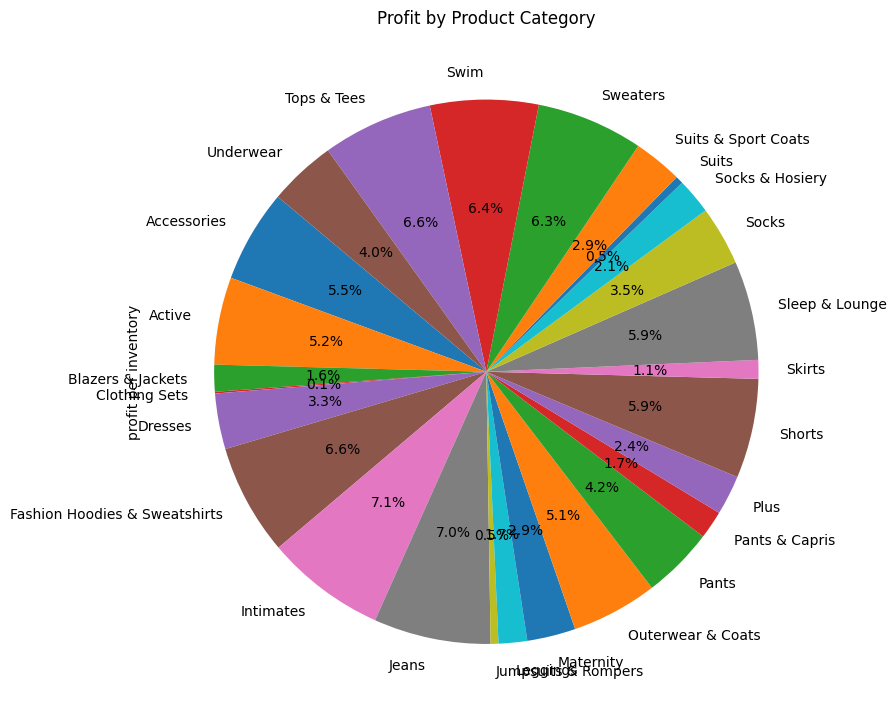

In [443]:
# Plotting a pie chart for profit
plt.figure(figsize=(9, 9))
profit_by_category.plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Profit by Product Category')
plt.tight_layout()
plt.show()

## Sales and Revenue analysis based on product and its count

In [459]:
total_sales=merged_df.groupby('product_id_x')['sale_price'].sum()
total_cost=merged_df.groupby('product_id_y')['cost'].sum()

In [460]:
total_profit=total_sales-total_cost

In [461]:
total_profit

product_id_x
1         65.856000
2         65.747000
3         56.990000
4        152.604000
5        208.210001
            ...    
29116    591.632654
29117    202.824001
29118    142.560000
29119     87.010737
29120    533.676001
Length: 28698, dtype: float64

In [462]:
# PROFIT MARGIN
profit_margin=(total_profit/total_cost)*100
profit_margin

product_id_x
1         81.159421
2         89.753321
3         69.491526
4         89.035917
5         79.533214
            ...    
29116    182.485877
29117    167.379681
29118    184.090911
29119    149.376560
29120    164.550266
Length: 28698, dtype: float64

In [463]:
profit_margin.describe()

count    28698.000000
mean       108.985149
std         31.383241
min         49.253732
25%         83.486238
50%        105.338808
75%        131.481481
max        202.114800
dtype: float64

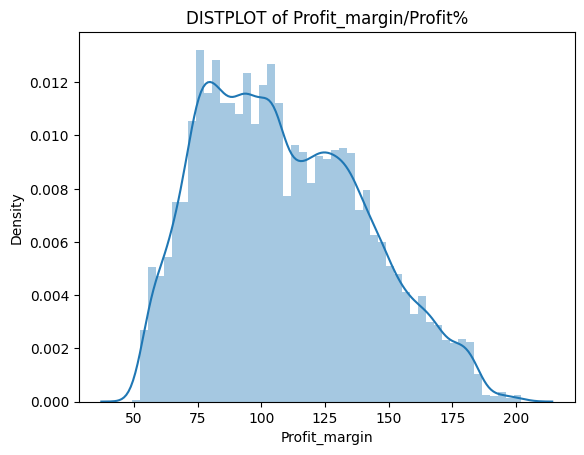

In [465]:
sns.distplot(x=profit_margin.values)
plt.xlabel("Profit_margin")
plt.title("DISTPLOT of Profit_margin/Profit%")
plt.show()

### inference:
1. on the basis of project the average profit incurred by the ecommerse is 108%.
2. mode < median < mean; the profit margin is right skewed.

### Key points:
Sales Analysis:
- Sales Trends: Examined sales trends over time to identify seasonal patterns, spikes in demand, or fluctuations in sales volumes.
- Product Performance: Evaluated the performance of individual products, categories, or brands based on their sales figures.

Revenue Analysis:
- Total Revenue: Calculated the total revenue generated from product sales by summing up the retail prices of all sold items.
- Profitability: Assessed the profitability of product sales by comparing revenue with associated costs, including inventory costs.


Suggestions for Revenue Improvement:

- Product Diversification: Consider expanding the product range to cater to diverse customer preferences and capture new market segments.
- Price Optimization: Analyze pricing strategies to ensure competitiveness while maximizing profitability. Implement dynamic pricing models or discounts to stimulate sales.
- Inventory Management: Optimize inventory levels to prevent stockouts or excess inventory, minimizing carrying costs and maximizing sales potential.
- Customer Engagement: Enhance customer engagement and loyalty through targeted marketing campaigns, personalized offers, and excellent customer service.
- Market Expansion: Explore opportunities for market expansion through geographical expansion, partnerships, or online sales channels to reach new customers and increase sales.

Overall, the Sales and Revenue Analysis provided valuable insights into product performance, revenue generation, and profitability. By implementing the suggested strategies for revenue improvement, businesses can optimize their sales processes, enhance profitability, and drive sustainable growth.

# PRODUCT PERFORMANCE ANALYSIS

In [576]:
products_df = pd.read_csv('products.csv')

In [577]:
products_df.head(3)

,id,cost,category,name,brand,retail_price,department,sku,distribution_center_id
0,13842,2.51875,Accessories,Low Profile Dyed Cotton Twill Cap - Navy W39S55D,MG,6.25,Women,EBD58B8A3F1D72F4206201DA62FB1204,1
1,13928,2.33835,Accessories,Low Profile Dyed Cotton Twill Cap - Putty W39S55D,MG,5.95,Women,2EAC42424D12436BDD6A5B8A88480CC3,1
2,14115,4.87956,Accessories,Enzyme Regular Solid Army Caps-Black W35S45D,MG,10.99,Women,EE364229B2791D1EF9355708EFF0BA34,1


### DATA PREPROCESSING

In [578]:
products_df.describe()

,id,cost,retail_price,distribution_center_id
count,29120.000000,29120.000000,29120.000000,29120.000000
mean,14560.500000,28.481774,59.220164,4.982898
std,8406.364256,30.624681,65.888927,2.901153
min,1.000000,0.008300,0.020000,1.000000
25%,7280.750000,11.275613,24.000000,2.000000
50%,14560.500000,19.675081,39.990002,5.000000
75%,21840.250000,34.440000,69.949997,8.000000
max,29120.000000,557.151002,999.000000,10.000000


In [579]:
products_df.shape

(29120, 9)

In [580]:
#null value handling
products_df.isnull().sum()

id                         0
cost                       0
category                   0
name                       2
brand                     24
retail_price               0
department                 0
sku                        0
distribution_center_id     0
dtype: int64

In [581]:
products_df.dropna(inplace=True)

In [582]:
products_df.isnull().sum()

id                        0
cost                      0
category                  0
name                      0
brand                     0
retail_price              0
department                0
sku                       0
distribution_center_id    0
dtype: int64

In [583]:
products_df.duplicated().sum()
# no duplicates in products_df

0

In [584]:
products_df.dtypes

id                          int64
cost                      float64
category                   object
name                       object
brand                      object
retail_price              float64
department                 object
sku                        object
distribution_center_id      int64
dtype: object

In [585]:
categorical_columns=['category','brand','department','distribution_center_id']
for i in categorical_columns:
    print(products_df[i].value_counts())
    print("-------------------------")

Intimates                        2358
Jeans                            1997
Fashion Hoodies & Sweatshirts    1865
Tops & Tees                      1864
Swim                             1796
Sleep & Lounge                   1770
Shorts                           1765
Sweaters                         1737
Accessories                      1557
Active                           1432
Outerwear & Coats                1416
Underwear                        1088
Pants                            1041
Dresses                           955
Socks                             903
Maternity                         898
Plus                              756
Suits & Sport Coats               739
Socks & Hosiery                   665
Pants & Capris                    613
Leggings                          564
Blazers & Jackets                 561
Skirts                            367
Suits                             188
Jumpsuits & Rompers               162
Clothing Sets                      37
Name: catego

## EXPLORATORY DATA ANALYSIS

In [586]:
products_df.rename(columns={'id':'product_id'}, inplace= True)

In [587]:
# merging products table with order_item table
merged_df2 = pd.merge(order_items_df, products_df, on='product_id', how='inner')

In [588]:
merged_df2['total_sales']=merged_df2.groupby('product_id')['sale_price'].sum()
merged_df2['total_cost']=merged_df2.groupby('product_id')['cost'].sum()

In [589]:
merged_df2['profit']=merged_df2['total_sales']-merged_df2['total_cost']

In [590]:
merged_df2.head(1)

,id,order_id,user_id,product_id,inventory_item_id,status,created_at,sale_price,Quantity_sold,cost,category,name,brand,retail_price,department,sku,distribution_center_id,total_sales,total_cost,profit
0,152013,104663,83582,14235,410368,Cancelled,2023-05-07 06:08:40+00:00,0.02,1,0.0083,Accessories,Indestructable Aluminum Aluma Wallet - RED,marshal,0.02,Women,8425BC94A44E3D1BB3C8C026B2702C00,1,NaN,NaN,NaN


In [591]:
merged_df2[merged_df2['profit']<0]

,id,order_id,user_id,product_id,inventory_item_id,status,created_at,sale_price,Quantity_sold,cost,category,name,brand,retail_price,department,sku,distribution_center_id,total_sales,total_cost,profit


### category vise profit analysis for products

In [592]:
category_vise_spread_of_profit=merged_df2.groupby('category').agg({'profit':['sum','min','max','mean']})

In [593]:
category_vise_spread_of_profit

profit                         \
                                         sum       min          max   
category                                                              
Accessories                    468336.278745   2.39184  4225.499989   
Active                         247745.568253   3.66528  2300.760008   
Blazers & Jackets              135791.822349   3.52294  5110.979980   
Clothing Sets                   10670.324705  14.51800  1198.942483   
Dresses                        206612.241131   4.58900  4160.834992   
Fashion Hoodies & Sweatshirts  297615.425985   1.25048  2762.100006   
Intimates                      569165.260377   3.92607  7246.574977   
Jeans                          319756.217895   2.97830  4794.929984   
Jumpsuits & Rompers             28195.632388   4.22895  1327.908383   
Leggings                       179220.907093   3.94695  3876.579000   
Maternity                      209016.868375   4.51096  2526.480000   
Outerwear & Coats              227738.671084   5.67600  3691.463990   
Pants                          161732.165289   9.46245  2368.389638   
Pants & Capris                 107506.909077   4.30000  2562.664007   
Plus                           238352.345350   3.50000  4544.799981   
Shorts                         257896.525743   0.07020  3438.000005   
Skirts                          82960.202093   2.64882  3375.414012   
Sleep & Lounge                 269854.612062   2.30575  5242.079985   
Socks                          163408.395912   4.10935  5776.470014   
Socks & Hosiery                231919.479586   5.92860  2269.140009   
Suits                           34380.456314   3.40664  2577.899994   
Suits & Sport Coats            109941.378796   4.28064  2354.990002   
Sweaters                       279353.972775   1.55120  2755.704015   
Swim                           341631.934851   5.90121  3591.810002   
Tops & Tees                    311104.407393   4.03202  3071.249991   
Underwear                      125922.543843   4.27686  3070.979983   

                                           
                                     mean  
category                                   
Accessories                    189.609829  
Active                         194.157969  
Blazers & Jackets              221.159320  
Clothing Sets                  159.258578  
Dresses                        196.773563  
Fashion Hoodies & Sweatshirts  193.886271  
Intimates                      197.011167  
Jeans                          192.161189  
Jumpsuits & Rompers            166.838061  
Leggings                       203.660122  
Maternity                      192.464888  
Outerwear & Coats              180.315654  
Pants                          215.930795  
Pants & Capris                 169.036021  
Plus                           203.372308  
Shorts                         177.370375  
Skirts                         189.406854  
Sleep & Lounge                 189.106245  
Socks                          176.657725  
Socks & Hosiery                207.256014  
Suits                          188.903606  
Suits & Sport Coats            204.732549  
Sweaters                       199.538552  
Swim                           195.106759  
Tops & Tees                    191.802964  
Underwear                      195.228750

In [594]:
category_vise_mean_profit=merged_df2.groupby('category')['profit'].mean()

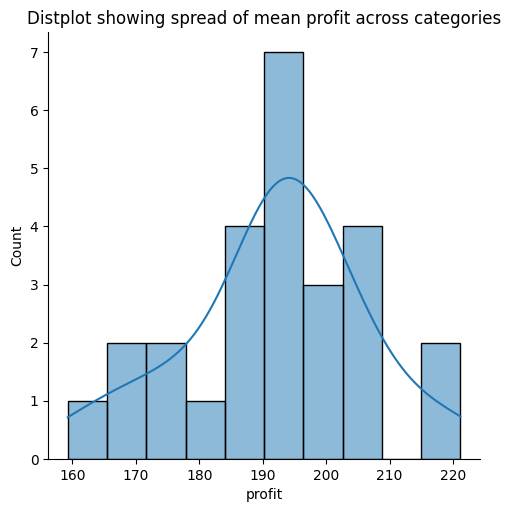

In [595]:
sns.displot(x=category_vise_mean_profit,kde=True,palette='Set2')
plt.title("Distplot showing spread of mean profit across categories")
plt.show()

### inference:
1. average profit is nearly normally spread across the categories and hence categories do playy vital role in linear variance of total sales.

In [596]:
merged_df2.nunique()

id                        181600
order_id                  125152
user_id                    80013
product_id                 29020
inventory_item_id         181600
status                         5
created_at                181367
sale_price                  4188
Quantity_sold                  4
cost                       26293
category                      26
name                       27215
brand                       2752
retail_price                4188
department                     2
sku                        29020
distribution_center_id        10
total_sales                 8843
total_cost                 28442
profit                     28427
dtype: int64

In [597]:
# droping those rows where the status is 'Cancelled'
accepted_orders=merged_df2[merged_df2['status']!='Cancelled']
accepted_orders.nunique()

id                        154542
order_id                  106558
user_id                    72096
product_id                 28933
inventory_item_id         154542
status                         4
created_at                154384
sale_price                  4178
Quantity_sold                  4
cost                       26223
category                      26
name                       27138
brand                       2752
retail_price                4178
department                     2
sku                        28933
distribution_center_id        10
total_sales                 7931
total_cost                 24327
profit                     24321
dtype: int64

In [598]:
merged_df2[['retail_price','sale_price']]

,retail_price,sale_price
0,0.02,0.02
1,0.02,0.02
2,0.02,0.02
3,0.02,0.02
4,0.02,0.02
...,...,...
181595,903.00,903.00
181596,903.00,903.00
181597,903.00,903.00
181598,903.00,903.00


In [559]:
merged_df2[merged_df2['retail_price']>merged_df2['sale_price']]

,id,order_id,user_id,product_id,inventory_item_id,status,created_at,sale_price,Quantity_sold,cost,category,name,brand,retail_price,department,sku,distribution_center_id,total_sales,total_cost,profit


#### retail price is same as sale price so their is no promotion applied and selling prices have remained same.

### Product performance:

In [663]:
#Counting orders per product
orders_per_product = merged_df2['product_id'].value_counts()

orders_per_product

18795    21
21842    19
17045    19
25209    18
25547    18
         ..
19497     1
2231      1
295       1
5263      1
18146     1
Name: product_id, Length: 29020, dtype: int64

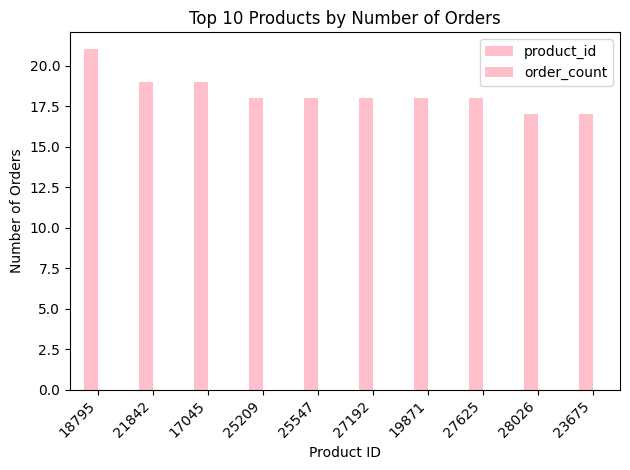

In [612]:
top_10_orders = orders_per_product.head(10)
top_10_orders.plot(kind='bar', color='pink')
plt.title('Top 10 Products by Number of Orders')
plt.xlabel('Product ID')
plt.ylabel('Number of Orders')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### inference:
1. product_id '18795' is the frequent flyer off the carts.
2. The chart gives us the top 10 most ordered products.

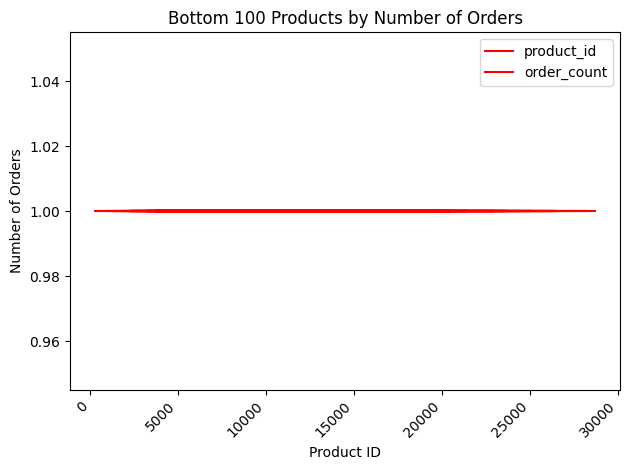

In [621]:
Bottom_100_orders = orders_per_product.tail(100)
Bottom_100_orders.plot(kind='line', color='red')
plt.title('Bottom 100 Products by Number of Orders')
plt.xlabel('Product ID')
plt.ylabel('Number of Orders')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### inference:
1. Bottom 100 products are only ordered once.

In [652]:
#Calculating revenue per product
quantity=merged_df2.groupby(["order_id","product_id"])["product_id"].count()
sales_price=merged_df2.groupby(["order_id","product_id"])["sale_price"].sum()
revenue = quantity*sales_price

In [643]:
quantity.values

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [644]:
sales_price.values

array([ 15.        , 125.        ,  19.98999977, ...,  25.        ,
        22.5       , 129.94999695])

In [653]:
revenue

order_id  product_id
1         2953           15.000000
          4731          125.000000
          7656           19.990000
2         25774          22.000000
3         22308          59.990002
                           ...    
125223    21923          21.990000
125224    20828          42.980000
          25959          25.000000
125225    10743          22.500000
125226    10017         129.949997
Length: 181593, dtype: float64

In [658]:
rev=revenue.reset_index()
rev.columns=['order_id','product_id','revenue']

In [673]:
revenue_per_order = rev.groupby('order_id')['revenue'].sum()
revenue_per_order.sort_values(ascending=False)

order_id
101797    1347.289982
35450     1341.489998
27087     1312.570004
66874     1283.489990
88267     1275.329987
             ...     
47894        0.490000
19512        0.490000
46269        0.490000
28204        0.020000
104663       0.020000
Name: revenue, Length: 125152, dtype: float64

#### inference:-
1. order_id 101797  generated highest revenue  1347.289982 Rs.
 

In [669]:
revenue_per_product=merged_df2.groupby("product_id")["sale_price"].sum()
revenue_per_product=revenue_per_product.sort_values(ascending=False)
revenue_per_product

product_id
24428    13545.00
8721     11130.00
23803     9780.00
2719      9730.00
23951     9030.00
           ...   
13614        4.01
14549        3.96
28689        2.80
14159        1.96
14235        0.12
Name: sale_price, Length: 29020, dtype: float64

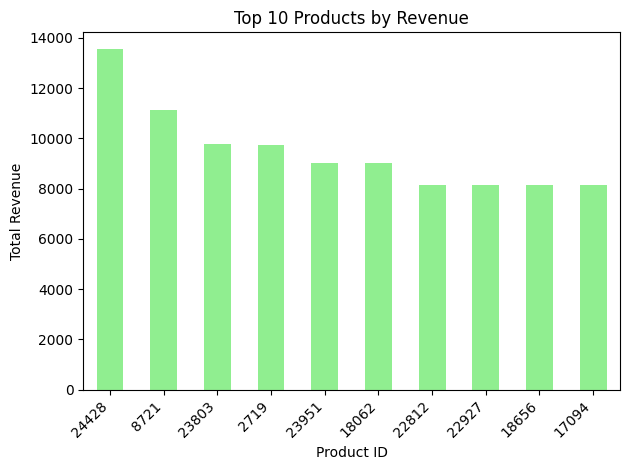

In [670]:
top_10_revenue = revenue_per_product.head(10)
top_10_revenue.plot(kind='bar', color='lightgreen')
plt.title('Top 10 Products by Revenue')
plt.xlabel('Product ID')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### KEY POINTS:
- Top-Selling Products: Identified top-selling products or bestsellers within each category or brand to understand consumer preferences.
- Popularity Trends: Analyzed popularity trends over time to identify emerging trends, seasonal variations, or changes in consumer preferences.

Suggestions for Product Performance Improvement:

- Product Portfolio Optimization: Evaluate the product portfolio to identify underperforming or obsolete products that can be discontinued or replaced with more profitable alternatives.
- Price Adjustment: Review pricing strategies to ensure competitiveness and alignment with market trends. Consider implementing dynamic pricing or promotional strategies to stimulate sales.
- New Product Development: Invest in research and development to introduce innovative products or product variations that cater to evolving consumer needs and preferences.
- Marketing and Promotion: Develop targeted marketing campaigns to increase product visibility, enhance brand awareness, and drive customer engagement. Utilize social media, email marketing, and influencer partnerships to reach a wider audience.
- Inventory Management: Implement effective inventory management practices to optimize stock levels, minimize carrying costs, and prevent stockouts or overstock situations.

# User Demographics Analysis:

In [674]:
users_df.head()

,id,first_name,last_name,email,age,gender,state,street_address,postal_code,city,country,latitude,longitude,traffic_source,created_at,total_duration,session_count_per_user,event_type_count
1,6578,Elizabeth,Martinez,elizabethmartinez@example.com,34,F,Acre,1705 Nielsen Land,69917-400,Rio Branco,Brasil,-9.945568,-67.83561,Search,2023-11-08 18:49:00+00:00,175666.0,3.0,4.0
2,36280,Christopher,Mendoza,christophermendoza@example.net,13,M,Acre,125 Turner Isle Apt. 264,69917-400,Rio Branco,Brasil,-9.945568,-67.83561,Email,2019-08-24 06:10:00+00:00,434.0,1.0,5.0
3,60193,Jimmy,Conner,jimmyconner@example.com,64,M,Acre,0966 Jose Branch Apt. 008,69917-400,Rio Branco,Brasil,-9.945568,-67.83561,Search,2020-02-15 11:26:00+00:00,13043069.0,5.0,5.0
4,64231,Natasha,Wilson,natashawilson@example.net,25,F,Acre,20798 Phillip Trail Apt. 392,69917-400,Rio Branco,Brasil,-9.945568,-67.83561,Search,2020-03-13 06:45:00+00:00,308.0,1.0,5.0
5,72187,Andrea,Bryant,andreabryant@example.org,47,F,Acre,622 Sims Field,69917-400,Rio Branco,Brasil,-9.945568,-67.83561,Search,2022-05-27 14:53:00+00:00,348876.0,3.0,4.0


In [675]:
users_df.isnull().sum()

id                        0
first_name                0
last_name                 0
email                     0
age                       0
gender                    0
state                     0
street_address            0
postal_code               0
city                      0
country                   0
latitude                  0
longitude                 0
traffic_source            0
created_at                0
total_duration            0
session_count_per_user    0
event_type_count          0
dtype: int64

In [678]:
users_df.dtypes

id                          int64
first_name                 object
last_name                  object
email                      object
age                         int64
gender                     object
state                      object
street_address             object
postal_code                object
city                       object
country                    object
latitude                  float64
longitude                 float64
traffic_source             object
created_at                 object
total_duration            float64
session_count_per_user    float64
event_type_count          float64
dtype: object

In [679]:
cat_col=['gender','city','country','state','traffic_source']
for i in cat_col:
    print(users_df[i].value_counts())
    print("***********************")

F    39784
M    39488
Name: gender, dtype: int64
***********************
Shanghai            2005
Beijing             1728
Seoul               1204
Shenzhen            1064
Dongguan             726
                    ... 
Bernburg (Saale)       1
Goobarragandra         1
Coonamble              1
Dubbo                  1
Essouvert              1
Name: city, Length: 7611, dtype: int64
***********************
China             27225
United States     17963
Brasil            11103
South Korea        4281
France             3724
United Kingdom     3625
Germany            3333
Spain              3208
Japan              1943
Australia          1712
Belgium             946
Poland              188
Colombia             15
Deutschland           2
España                2
Austria               2
Name: country, dtype: int64
***********************
Guangdong     4291
England       3209
California    2962
Texas         1993
Shanghai      1993
              ... 
Wakayama         2
Nara             1
T

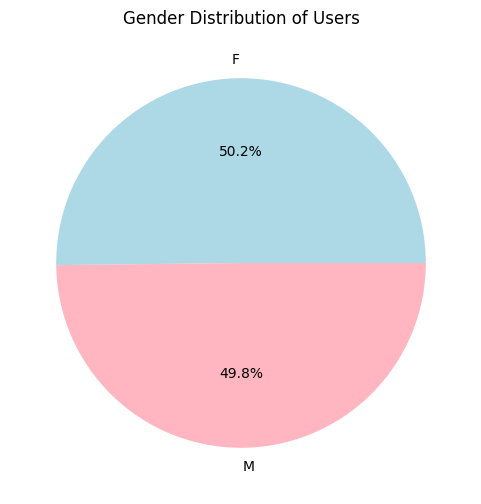

In [682]:
#Analyzing gender distribution
plt.figure(figsize=(6, 6))
users_df['gender'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=['lightblue', 'lightpink'])
plt.title('Gender Distribution of Users')
plt.ylabel('')
plt.show()

#### infrence:
1. number of female users is slightly greater than males.

In [1068]:
users_df['created_at'] = pd.to_datetime(users_df['created_at'])


#### Gender trends over time

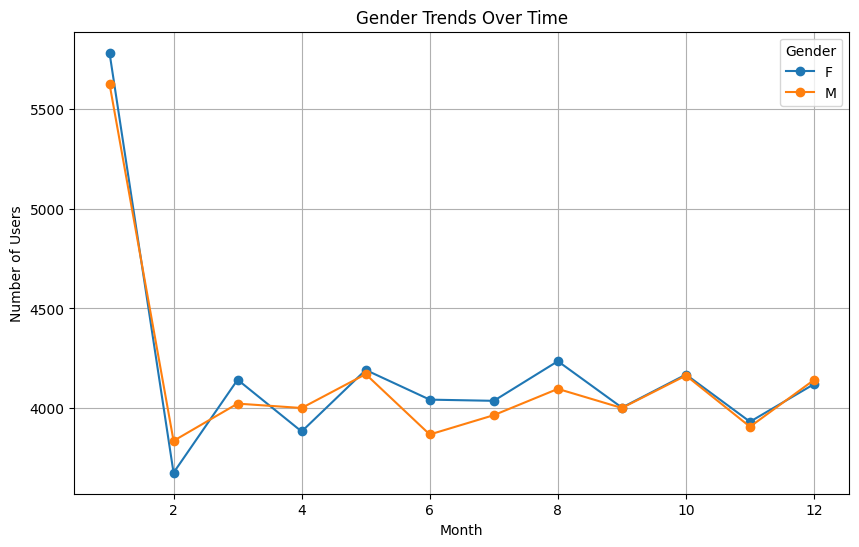

In [1071]:
users_df['created_month'] = users_df['created_at'].dt.month
gender_trends = users_df.groupby(['created_month', 'gender']).size().unstack()

gender_trends.plot(kind='line', marker='o', figsize=(10, 6))
plt.title('Gender Trends Over Time')
plt.xlabel('Month')
plt.ylabel('Number of Users')
plt.grid(True)
plt.legend(title='Gender')
plt.show()


#### Infrence:
1. Gender trends seem consistent.
2. Female users are purchasing more in months of May to September, indicating their higher purchase for swin wear and intimates in summers.

In [683]:
# AGE-BINS
bins = [0, 18, 30, 40, 50, 60, 100]
labels = ['0-18', '19-30', '31-40', '41-50', '51-60', '61+']
users_df['age_group'] = pd.cut(users_df['age'], bins=bins, labels=labels, right=False)
users_df[['age', 'age_group']].head()

,age,age_group
1,34,31-40
2,13,0-18
3,64,61+
4,25,19-30
5,47,41-50


#### Analysing age trend over time

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


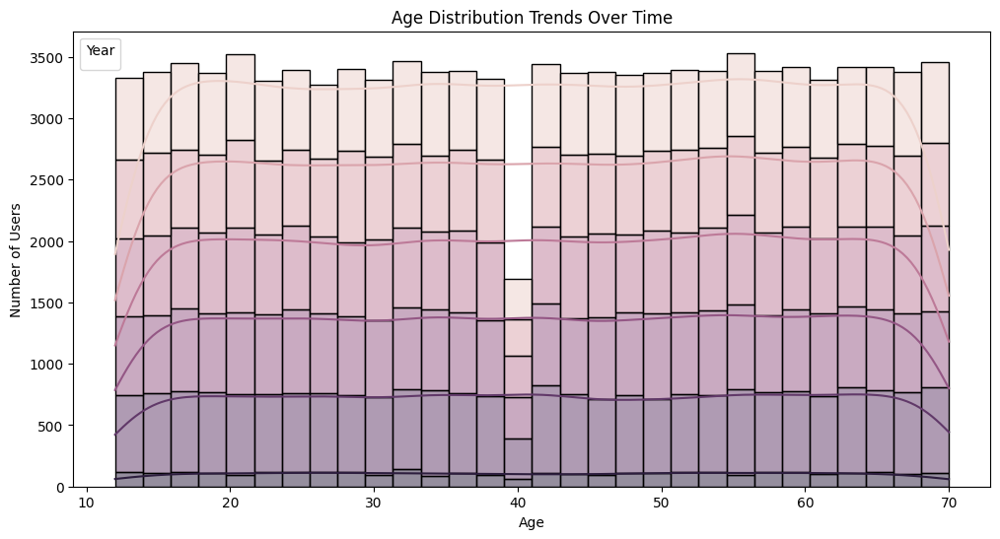

In [1072]:
users_df['created_year'] = users_df['created_at'].dt.year

plt.figure(figsize=(12, 6))
sns.histplot(data=users_df, x='age', hue='created_year', multiple='stack', bins=30, kde=True)
plt.title('Age Distribution Trends Over Time')
plt.xlabel('Age')
plt.ylabel('Number of Users')
plt.legend(title='Year')
plt.show()


#### Inference:
1. Though th mean age is 40 but , people anongst that age group are least number of buyers.(38-40)
2. Heavy number of buyers belong to early 40s and we can see that trend change in the graph.

### user analysis based on location

In [691]:
top_states = users_df['state'].value_counts().head(10)
top_cities = users_df['city'].value_counts().head(10)
top_countries = users_df['country'].value_counts().head(10)

In [692]:
top_states

Guangdong     4291
England       3209
California    2962
Texas         1993
Shanghai      1993
São Paulo     1713
Zhejiang      1677
Beijing       1663
Hebei         1606
Jiangsu       1534
Name: state, dtype: int64

In [693]:
top_cities

Shanghai    2005
Beijing     1728
Seoul       1204
Shenzhen    1064
Dongguan     726
New York     674
Chengdu      670
Foshan       611
Tokyo        608
Wuhan        567
Name: city, dtype: int64

In [694]:
top_countries

China             27225
United States     17963
Brasil            11103
South Korea        4281
France             3724
United Kingdom     3625
Germany            3333
Spain              3208
Japan              1943
Australia          1712
Name: country, dtype: int64

In [695]:
map_center = [users_df['latitude'].mean(), users_df['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=4)

In [697]:
from folium.plugins import MarkerCluster
marker_cluster = MarkerCluster().add_to(m)

In [698]:
for _, row in users_df.iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']],
                  popup=row['city'] + ', ' + row['state'] + ', ' + row['country']).add_to(marker_cluster)

In [699]:
m.save('user_location_map.html')

### Traffic source analysis to identify what are  users favorite moves and improve on them. 

In [700]:
top_traffic_sources = users_df['traffic_source'].value_counts().head(10)
print("Top 10 Traffic Sources:")
print(top_traffic_sources)

Top 10 Traffic Sources:
Search      55476
Organic     12053
Facebook     4613
Email        3922
Display      3208
Name: traffic_source, dtype: int64


In [701]:
# average age and gender distribution for each traffic source
traffic_source_stats = users_df.groupby('traffic_source').agg({'age': 'mean', 'gender': lambda x: x.value_counts(normalize=True)[0]})
traffic_source_stats.rename(columns={'gender': 'female_percentage'}, inplace=True)

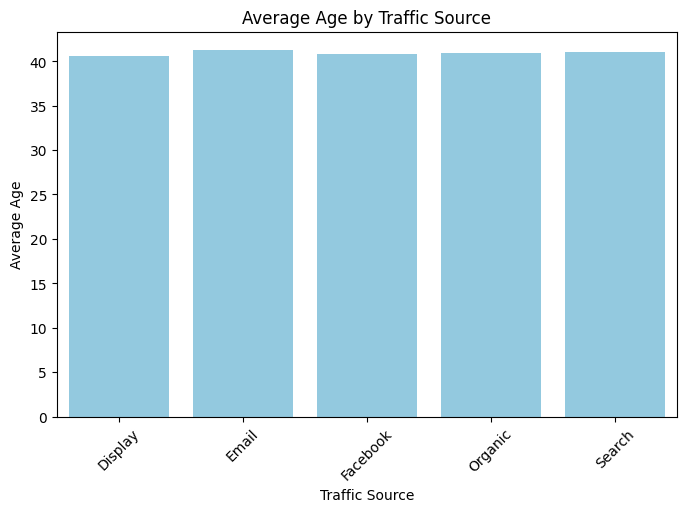

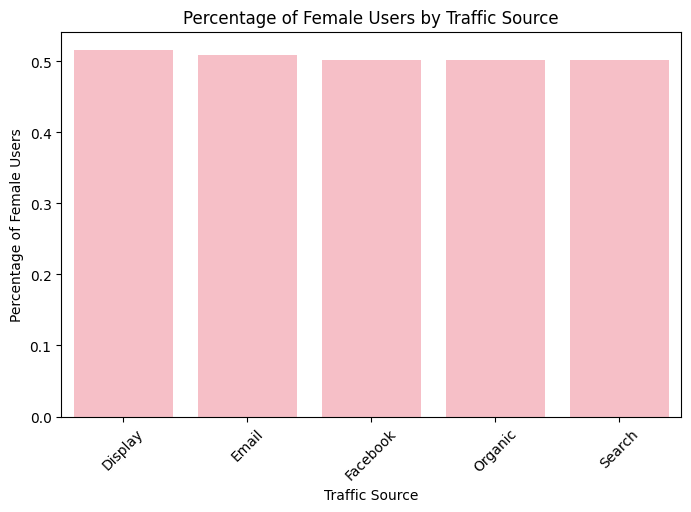

In [705]:
plt.figure(figsize=(8, 5))
sns.barplot(data=traffic_source_stats.reset_index(), x='traffic_source', y='age', color='skyblue')
plt.title('Average Age by Traffic Source')
plt.xlabel('Traffic Source')
plt.ylabel('Average Age')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(8, 5))
sns.barplot(data=traffic_source_stats.reset_index(), x='traffic_source', y='female_percentage', color='lightpink')
plt.title('Percentage of Female Users by Traffic Source')
plt.xlabel('Traffic Source')
plt.ylabel('Percentage of Female Users')
plt.xticks(rotation=45)
plt.show()

### inference:
1. females are certainly using all the traffic sources and almost more than 50%  females are using displays and emails to access the website. 
2. average age of users through all the traffic sources lies between 40-60, these are our higgh priority target age group.
3. Female users are also our high priority target group.

In [706]:
traffic_source_stats

,age,female_percentage
traffic_source,,
Display,40.578865,0.516209
Email,41.282509,0.509179
Facebook,40.778452,0.501626
Organic,40.908985,0.501535
Search,41.064388,0.501550


### Product preference based on age group

In [710]:
users_df.columns

Index(['id', 'first_name', 'last_name', 'email', 'age', 'gender', 'state',
       'street_address', 'postal_code', 'city', 'country', 'latitude',
       'longitude', 'traffic_source', 'created_at', 'total_duration',
       'session_count_per_user', 'event_type_count', 'age_group'],
      dtype='object')

In [711]:
users_df.rename(columns={'id':'user_id'}, inplace= True)

In [712]:
# joining 3 tables to obtain common rows
merged_df3 = pd.merge(users_df, order_items_df, how='inner', on='user_id')
merged_df3 = pd.merge(merged_df3, products_df, how='inner', on='product_id')

In [715]:
product_preferences_by_age = merged_df3.groupby(['age_group', 'category']).size().unstack(fill_value=0)

In [716]:
#popular products among users in each age group
top_products_by_age = product_preferences_by_age.idxmax(axis=1)

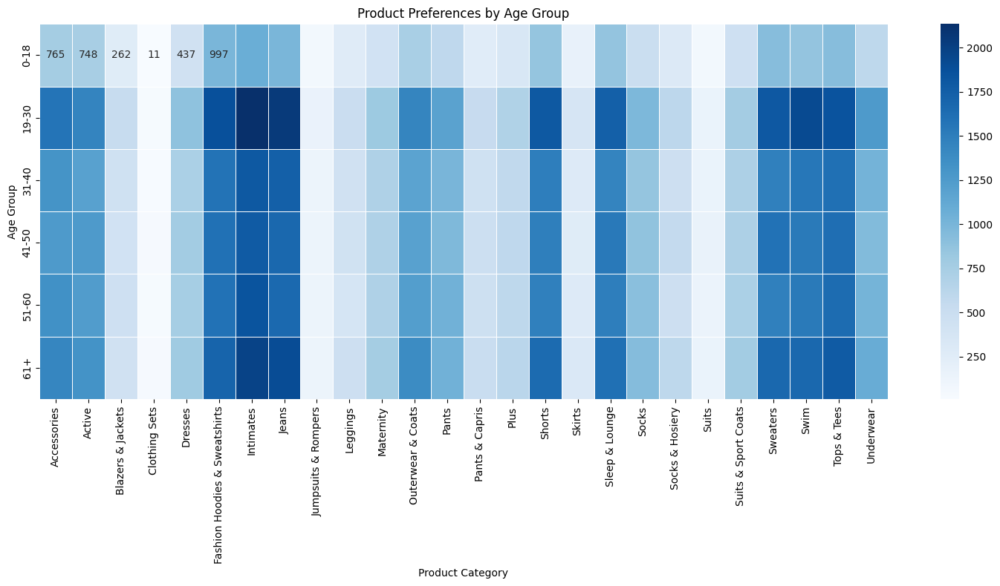

In [720]:
# correlation between diffrent age group and 
plt.figure(figsize=(15, 8))
sns.heatmap(product_preferences_by_age, cmap='Blues', annot=True, fmt='d', linewidths=.5)
plt.title('Product Preferences by Age Group')
plt.xlabel('Product Category')
plt.ylabel('Age Group')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [721]:
print("Top Products by Age Group:")
print(top_products_by_age)

Top Products by Age Group:
age_group
0-18     Intimates
19-30    Intimates
31-40    Intimates
41-50    Intimates
51-60    Intimates
61+      Intimates
dtype: object


### Inference:
1. young age group of 18-30 invest more in intimates, jeans,swim wear and sweaters.
2. clothing sets are least  favourite amongst all the products.
3. clearly all the age groups are buying most of 'Intimate' clothing from our ecommerce platform..

## MODEL DEVELOPMENT- KMEANS
user segments based on demographic attributes and behavioral patterns

In [722]:
cols = users_df[['age', 'gender', 'latitude', 'longitude', 'traffic_source']]

In [ ]:
# Encoding the categorical columns

In [725]:
cols_dum=pd.get_dummies(cols,columns=['gender','traffic_source'],drop_first=True)
cols_dum.head()

,age,latitude,longitude,gender_M,traffic_source_Email,traffic_source_Facebook,traffic_source_Organic,traffic_source_Search
1,34,-9.945568,-67.83561,0,0,0,0,1
2,13,-9.945568,-67.83561,1,1,0,0,0
3,64,-9.945568,-67.83561,1,0,0,0,1
4,25,-9.945568,-67.83561,0,0,0,0,1
5,47,-9.945568,-67.83561,0,0,0,0,1


In [726]:
# Standardizing the data
scaler = StandardScaler()
cols_scaled = scaler.fit_transform(cols_dum)

In [728]:
wcss = []
for i in range(1,10):
    model = KMeans(n_clusters=i)
    model.fit(cols_scaled)
    wcss.append(model.inertia_)
    
# model.inertia_ returns the WCSS values
print('WCSS\n',wcss)

WCSS
 [634175.9999999998, 520145.99261607474, 418499.4929465833, 331514.1661488528, 272828.3998030924, 229792.82742530812, 205785.30003813375, 184852.86340783405, 173988.4192724088]


In [729]:
from sklearn.metrics import silhouette_score

In [730]:
for i in range(2,10): # i = no of clusters
    m = KMeans(n_clusters=i,random_state=0).fit(cols_scaled)
    print(f'Silhoutte Score at K={i}',silhouette_score(cols_scaled,m.labels_))

Silhoutte Score at K=2 0.32637930118352576
Silhoutte Score at K=3 0.35097633004220463
Silhoutte Score at K=4 0.2702024750838779
Silhoutte Score at K=5 0.3426423347719171
Silhoutte Score at K=6 0.3378132233337051
Silhoutte Score at K=7 0.3309503661201121
Silhoutte Score at K=8 0.36631308707803684
Silhoutte Score at K=9 0.3605215723802683


#### we got maximum silhoutte score at k=8, according to our scattering 8 seems to be a optimal cluster

In [740]:
k8 = KMeans(n_clusters=8)
k8.fit(cols_scaled)

KMeans()

In [742]:
ypred_k8 = k8.predict(cols_scaled)
print(ypred_k8[:50])

[7 3 7 7 7 7 7 3 7 7 7 7 2 7 7 3 7 7 7 7 7 2 7 2 5 5 0 6 5 5 1 0 0 0 0 1 1
 2 0 3 5 1 5 5 5 0 5 5 5 2]


In [744]:
from collections import Counter
c = Counter(ypred_k8)
print(c)

Counter({1: 12487, 5: 12475, 4: 12253, 2: 12053, 0: 11962, 7: 9507, 6: 4613, 3: 3922})


In [745]:
cent8 = k8.cluster_centers_
print(cent8.shape)
print(cent8)

(8, 8)
[[-8.83460414e-01  4.00253371e-01  1.05544858e-01  1.00374098e+00
  -2.28145636e-01 -2.48571105e-01 -4.23449432e-01  5.40210756e-01]
 [ 8.53169680e-01  4.05556332e-01  8.83333427e-02  1.00374098e+00
  -2.28145636e-01 -2.48571105e-01 -4.23449432e-01  5.39443041e-01]
 [-6.23875029e-03 -6.81510128e-03 -3.60466238e-03  6.80380180e-03
  -2.28145636e-01 -2.48571105e-01  2.36155707e+00 -1.52686482e+00]
 [ 1.56877788e-02  3.28663355e-02  2.29322054e-05 -1.46241034e-02
   4.38316514e+00 -2.48571105e-01 -4.23449432e-01 -1.52686482e+00]
 [ 2.65397456e-03  6.12015539e-01 -8.42664600e-01 -9.96272966e-01
  -2.28145636e-01 -2.48571105e-01 -4.23449432e-01  5.38483852e-01]
 [-1.14976451e-02  2.03932452e-01  1.02801156e+00 -9.96272966e-01
  -2.28145636e-01 -2.48571105e-01 -4.23449432e-01  5.27788946e-01]
 [-1.39012864e-02 -1.29498703e-02 -3.41067125e-03  6.98570795e-03
  -2.28145636e-01  4.02299374e+00 -4.23449432e-01 -1.52686482e+00]
 [ 1.08480566e-02 -2.09131357e+00 -5.05493890e-01  4.04956440e

In [751]:
cols_dum['Cls8'] = ypred_k8
cols_dum.head()

,age,latitude,longitude,gender_M,traffic_source_Email,traffic_source_Facebook,traffic_source_Organic,traffic_source_Search,Cls2,Cls8
1,34,-9.945568,-67.83561,0,0,0,0,1,7,7
2,13,-9.945568,-67.83561,1,1,0,0,0,3,3
3,64,-9.945568,-67.83561,1,0,0,0,1,7,7
4,25,-9.945568,-67.83561,0,0,0,0,1,7,7
5,47,-9.945568,-67.83561,0,0,0,0,1,7,7


In [752]:
cluster_counts8 = cols_dum['Cls8'].value_counts()

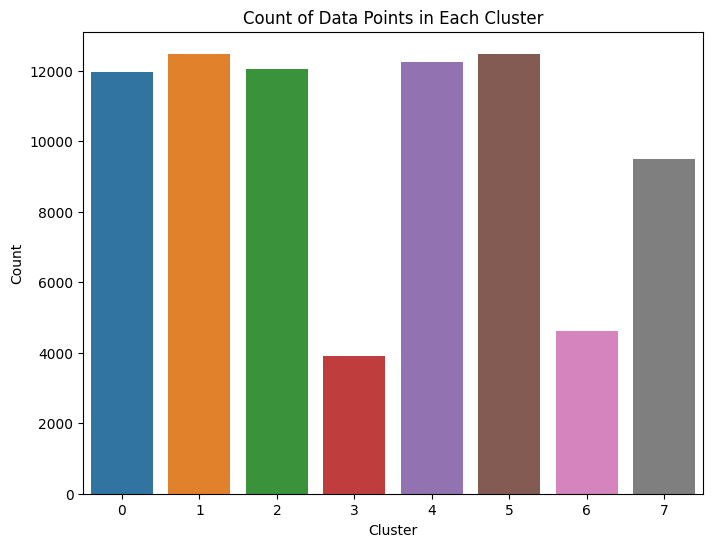

In [753]:
plt.figure(figsize=(8, 6))
sns.barplot(x=cluster_counts8.index, y=cluster_counts8.values)
plt.title('Count of Data Points in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count')

# Show the plot
plt.show()

### KEY POINTS:
Age Analysis:
- Age Distribution: Examined the distribution of user ages to understand the demographic composition of the user base.
- Age Groups: Grouped users into different age brackets or cohorts to analyze age-related patterns and preferences.
Gender Analysis:
- Gender Distribution: Analyzed the distribution of user genders to understand gender representation within the user base.
User Segmentation: 
- KMeans Analysis: This code provides insights into different user segments based on demographic attributes or behavioral patterns, allowing us to tailor our marketing strategies and user experiences to specific user groups. 
    
Suggestions for User Experience Improvement:

- Personalized Recommendations: Implement personalized recommendation systems based on user demographics, preferences, and past behavior to enhance user engagement and satisfaction.
- Localized Marketing Campaigns: Develop localized marketing campaigns and promotions tailored to specific regions or demographics to improve relevance and effectiveness.
- Enhanced Communication Channels: Offer multiple communication channels (e.g., live chat, email, social media) to provide personalized support and assistance to users based on their preferences.
- Accessibility and Localization: Ensure that the platform is accessible and localized to accommodate diverse user demographics, languages, and cultural preferences.
- Feedback Mechanisms: Implement feedback mechanisms to collect user feedback and suggestions for continuous improvement, ensuring that the platform evolves in alignment with user needs and expectations.

# ORDER FULFILLMENT ANALYSIS

In [1048]:
orders_df = pd.read_csv('orders.csv')

In [1049]:
orders_df.head()

,order_id,user_id,status,gender,created_at,returned_at,shipped_at,delivered_at,num_of_item
0,8,5,Cancelled,F,2022-10-20 10:03:00+00:00,NaN,NaN,NaN,3
1,60,44,Cancelled,F,2023-01-20 02:12:00+00:00,NaN,NaN,NaN,1
2,64,46,Cancelled,F,2021-12-06 09:11:00+00:00,NaN,NaN,NaN,1
3,89,65,Cancelled,F,2020-08-13 09:58:00+00:00,NaN,NaN,NaN,1
4,102,76,Cancelled,F,2023-01-17 08:17:00+00:00,NaN,NaN,NaN,2


In [1050]:
orders_df['created_at'] = pd.to_datetime(orders_df['created_at'])
orders_df['returned_at'] = pd.to_datetime(orders_df['returned_at'])
orders_df['shipped_at'] = pd.to_datetime(orders_df['shipped_at'])
orders_df['delivered_at'] = pd.to_datetime(orders_df['delivered_at'])

In [1051]:
orders_df['return_rate']=orders_df['returned_at'].notnull().astype(int)

In [1052]:
return_rate = orders_df['return_rate'].mean()
print("\nOrder Return Rate: {:.2f}%".format(return_rate * 100))


Order Return Rate: 10.01%


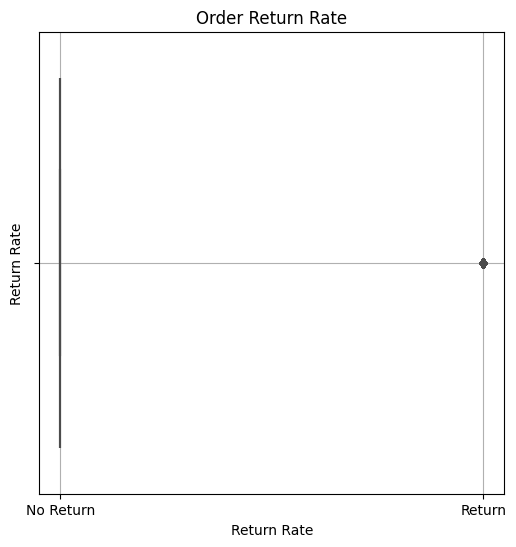

In [1053]:
plt.figure(figsize=(6, 6))
sns.boxplot(x=orders_df['return_rate'], color='orange')
plt.title('Order Return Rate')
plt.xlabel('Return Rate')
plt.xticks([0, 1], ['No Return', 'Return'])
plt.ylabel('Return Rate')
plt.grid(True)
plt.show()

### inference:
There are significantly low return rates

In [1054]:
orders_df.isnull().sum()

order_id             0
user_id              0
status               0
gender               0
created_at           0
returned_at     112696
shipped_at       43765
delivered_at     81342
num_of_item          0
return_rate          0
dtype: int64

In [1055]:
orders_df.shape

(125226, 10)

In [1056]:
orders_df.drop('returned_at',axis=1,inplace=True)

In [1057]:
orders_df.dropna(inplace=True)

In [1058]:
orders_df.shape

(43884, 9)

In [1059]:
orders_df['shipping_time'] = (orders_df['shipped_at'] - orders_df['created_at']).dt.days
orders_df['delivery_time'] = (orders_df['delivered_at'] - orders_df['shipped_at']).dt.days

In [1060]:
merged_df5['shipping_time'].describe()

count    63841.000000
mean         1.002773
std          0.813484
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max          2.000000
Name: shipping_time, dtype: float64

In [1061]:
merged_df5['delivery_time'].describe()

count    63841.000000
mean         2.013784
std          1.417355
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max          4.000000
Name: delivery_time, dtype: float64

In [1062]:
status_counts=orders_df['status'].value_counts()

### EXPLORATORY DATA ANALYSIS

#### Order Status analysis

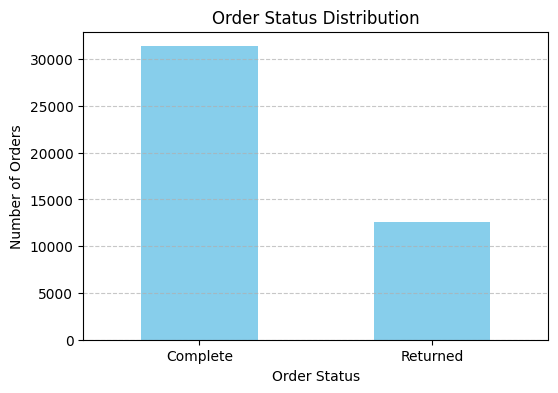

In [1063]:
plt.figure(figsize=(6, 4))
status_counts.plot(kind='bar', color='skyblue')
plt.title('Order Status Distribution')
plt.xlabel('Order Status')
plt.ylabel('Number of Orders')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#### inference:
1. Majority orders were completed successfully.
2. But the returned orders count is also significant as it reduces the revenue generation and cost the company with logistics and delivery cost too.

#### Trend analysis

In [1064]:
#Grouping by month and calculating average shipping time and delivery time
monthly_shipping_time = orders_df.groupby(orders_df['created_at'].dt.to_period('M'))['shipping_time'].mean()
monthly_delivery_time = orders_df.groupby(orders_df['created_at'].dt.to_period('M'))['delivery_time'].mean()

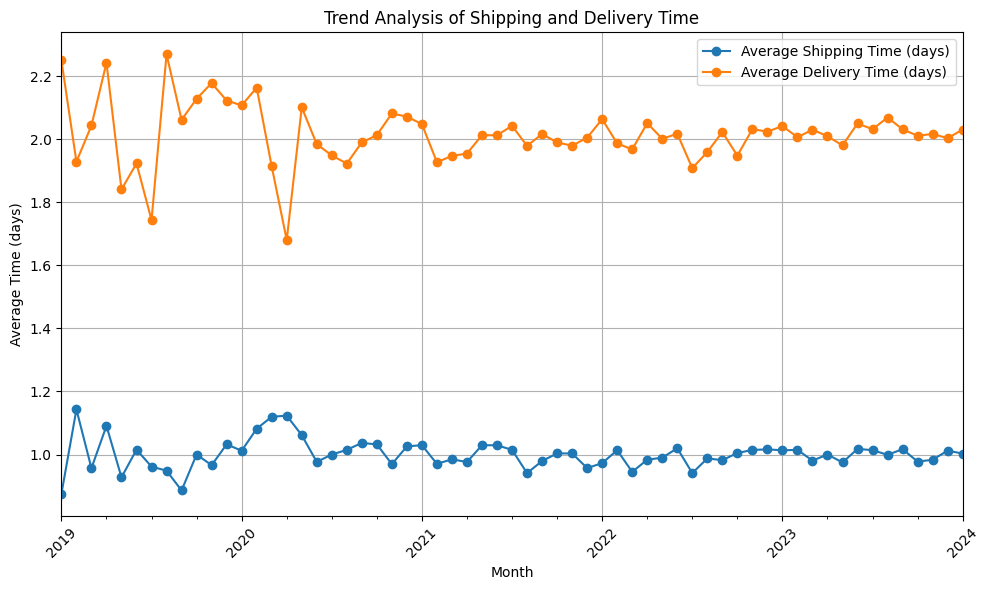

In [1065]:
plt.figure(figsize=(10, 6))
monthly_shipping_time.plot(label='Average Shipping Time (days)', marker='o')
monthly_delivery_time.plot(label='Average Delivery Time (days)', marker='o')
plt.title('Trend Analysis of Shipping and Delivery Time')
plt.xlabel('Month')
plt.ylabel('Average Time (days)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#### Inference:
1. The variance in the delivery time was quite high before 2021, it has reduced over time and now the average delivery time shows steady trends.
2. Average delivery time is around 2 days now.
3. The average shipping time has been around 1 day which imply that we are ensuring quick delivery.

#### Order fullfilment rate

In [1067]:
total_orders = len(orders_df)
completed_orders = orders_df[orders_df['status'] == 'completed'].shape[0]
fulfilment_rate = (completed_orders / total_orders) * 100
print("Order Fulfilment Rate: {:.8f}%".format(fulfilment_rate))


Order Fulfilment Rate: 0.00000000%


#### Dellivery time variance

In [1032]:
delivery_time_variance = orders_df['delivery_time'].std()

print("Delivery Time Variance: {:.2f} days".format(delivery_time_variance))

Delivery Time Variance: 1.42 days


#### Customer Retention Rate

In [837]:
unique_users = orders_df['user_id'].nunique()


In [838]:
repeat_customers = orders_df[orders_df.duplicated(subset=['user_id'], keep=False)]
retention_rate = (repeat_customers['user_id'].nunique() / unique_users) * 100
print("Customer Retention Rate: {:.2f}%".format(retention_rate))

Customer Retention Rate: 16.28%


#### inference:
1. Customer retention rate is quite low , that means customers are'nt coming back to shop more from our ecommerce website.

#### Order frequency check

In [839]:
orders_df['time_between_orders'] = orders_df.groupby('user_id')['created_at'].diff().dt.days

In [840]:
avg_order_frequency = orders_df['time_between_orders'].mean()

In [841]:
print("Average Order Frequency: {:.2f} days".format(avg_order_frequency))

Average Order Frequency: 3.24 days


#### inference:
1. average time between consecutive orders is 3.24 days for permanent customers.

#### AOV- Average Order Value

In [842]:
revenue_per_order

order_id
1         159.990000
2          22.000000
3          59.990002
4         108.750000
5         109.989998
             ...    
125222     55.000000
125223     21.990000
125224     67.980000
125225     22.500000
125226    129.949997
Name: revenue, Length: 125152, dtype: float64

In [844]:
# order value-
orders_df['revenue_per_order']=revenue_per_order
orders_df['order_value'] = orders_df['revenue_per_order'] / orders_df['num_of_item']
aov = orders_df['order_value'].mean()
print("Average Order Value: ${:.2f}".format(aov))


Average Order Value: $72.30


## PREDICTING REVENUE GIVEN CERTAIN FEATURES

In [891]:
features=['product_price','age','gender','status','shipping_time','delivery_time','return_rate','num_of_item','revenue_per_order']

In [892]:
features=pd.DataFrame(columns=features)

In [893]:
features.head()

,product_price,age,gender,status,shipping_time,delivery_time,return_rate,num_of_item,revenue_per_order


### feature extraction

In [894]:
merged_df6 = pd.merge(order_items_df, products_df, how='left', on='product_id')

In [895]:
order_product_cost = merged_df6.groupby('order_id')['cost'].sum()
order_product_cost

order_id
1         81.125810
2         10.384000
3         30.174971
4         47.306250
5         49.825469
            ...    
125222    28.930000
125223    10.027440
125224    34.009700
125225    11.902500
125226    78.099948
Name: cost, Length: 125226, dtype: float64

In [896]:
orders_df = pd.merge(orders_df, order_product_cost, how='left', on='order_id')
orders_df.head(1)

,order_id,user_id,status,gender,created_at,shipped_at,delivered_at,num_of_item,return_rate,shipping_time,delivery_time,time_between_orders,revenue_per_order,order_value,cost_x,cost_y,cost
0,7,4,Complete,F,2022-10-18 09:31:00+00:00,2022-10-19 00:36:00+00:00,2022-10-20 13:24:00+00:00,1,0,0,1,NaN,30.99,30.99,61.568,61.568,61.568


In [860]:
orders_df.columns

Index(['order_id', 'user_id', 'status', 'gender', 'created_at', 'shipped_at',
       'delivered_at', 'num_of_item', 'return_rate', 'shipping_time',
       'delivery_time', 'time_between_orders', 'revenue_per_order',
       'order_value', 'cost'],
      dtype='object')

In [897]:
features['product_price']=orders_df['cost']

In [898]:
merged_df7 = pd.merge(orders_df, users_df[['user_id', 'age']], on='user_id', how='left')

In [899]:
user_age=merged_df7.groupby('order_id')['age'].mean()

In [900]:
orders_df = pd.merge(orders_df, user_age, how='left', on='order_id')

In [902]:
features['age']=orders_df['age']

In [905]:
features['gender']=orders_df['gender']
features['status']=orders_df['status']
features['shipping_time']=orders_df['shipping_time']
features['delivery_time']=orders_df['delivery_time']
features['num_of_item']=orders_df['num_of_item']
features['revenue_per_order']=orders_df['revenue_per_order']
features['return_rate']=orders_df['return_rate']

In [906]:
features.head(3)

,product_price,age,gender,status,shipping_time,delivery_time,return_rate,num_of_item,revenue_per_order
0,61.568000,12.0,F,Complete,0,1,0,1,30.99
1,19.595101,NaN,F,Complete,1,2,0,1,135.00
2,24.684000,34.0,F,Complete,2,4,0,1,26.08


In [907]:
features.isnull().sum()

product_price           0
age                  9136
gender                  0
status                  0
shipping_time           0
delivery_time           0
return_rate             0
num_of_item             0
revenue_per_order      33
dtype: int64

In [908]:
nv_df = count_per_null(features)
nv_df

,Features,Count_Null,Per_Null
0,age,9136,20.818522
1,revenue_per_order,33,0.075198


In [ ]:
# as the percentage of null value is small in age we can replace it with mean

In [910]:
features['age'].fillna(features['age'].mean(),inplace=True)

In [911]:
nv_df = count_per_null(features)
nv_df

,Features,Count_Null,Per_Null
0,revenue_per_order,33,0.075198


In [912]:
# droping null values

In [913]:
features.dropna(inplace=True)

In [914]:
nv_df = count_per_null(features)
nv_df

,Features,Count_Null,Per_Null


In [915]:
# looking for duplicates
features.duplicated().sum()

0

In [916]:
# no duplicates in data

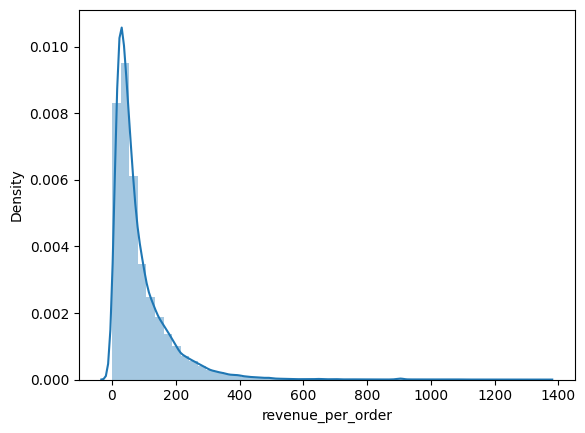

In [918]:
# TO CHECK NORMALITY OF OUR TARGET VARIABLE 'revenue_per_order'
sns.distplot(features['revenue_per_order'])
plt.show()

#### inference:
1. highly left skewed

In [920]:
from scipy.stats import jarque_bera

In [921]:
# Ho : Data is normally dist =>  p>0.05 => Ho is True
# H1 : Data is not normally dist => p<=0.05 
ts1,p1 = jarque_bera(features['revenue_per_order'])
print(ts1,p1)

839999.8116712595 0.0


In [ ]:
# Alternative hypothesis is true

In [922]:
ts2,p2 = jarque_bera(np.log(features['revenue_per_order']))
print(ts2,p2)

45.91147056536385 1.072632221057424e-10


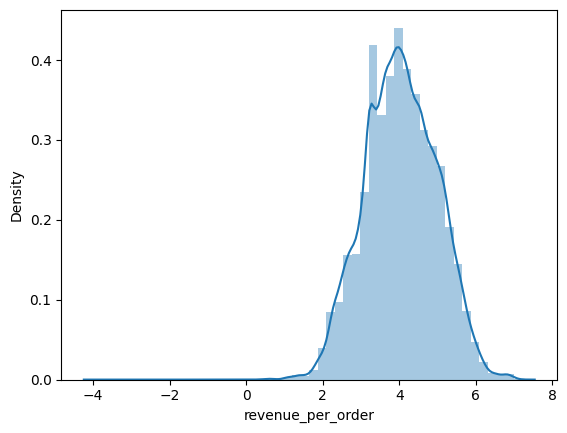

In [923]:
sns.distplot(np.log(features['revenue_per_order']))
plt.show()

In [ ]:
# it is still not normally distributed but the skewness has reduced so we can carry on with log values 

#### collinearity

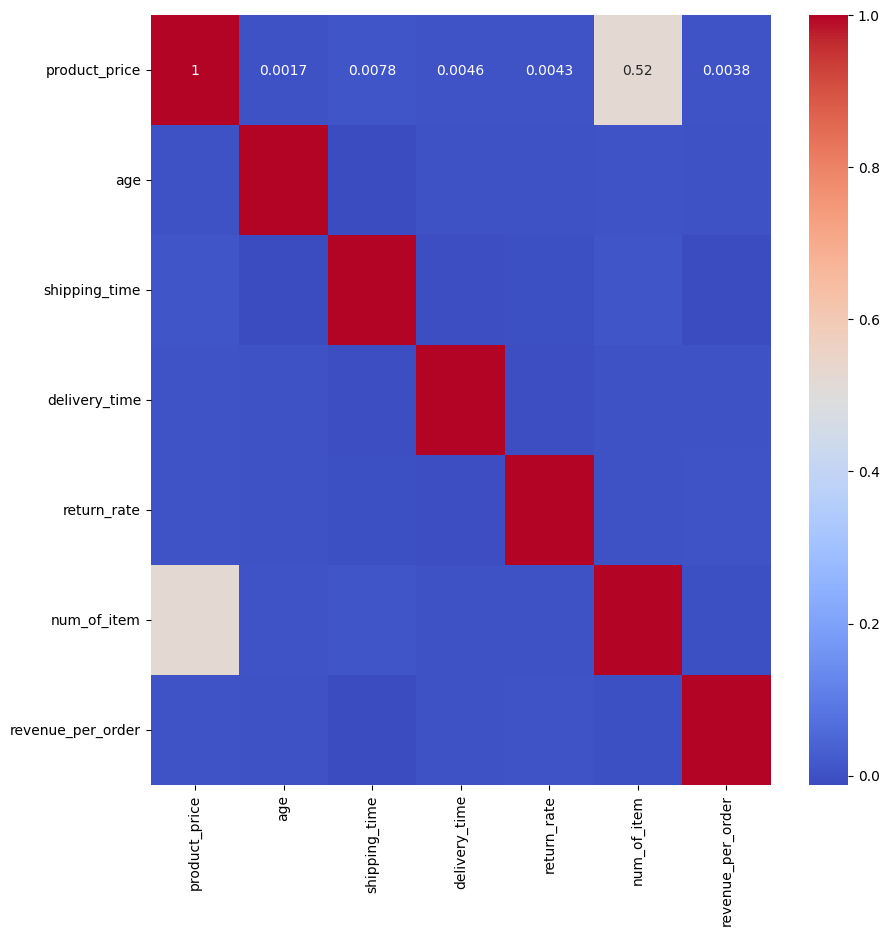

In [926]:
corr = features.corr()

plt.figure(figsize=(10,10))
sns.heatmap(corr,annot=True,cmap='coolwarm')
plt.show()

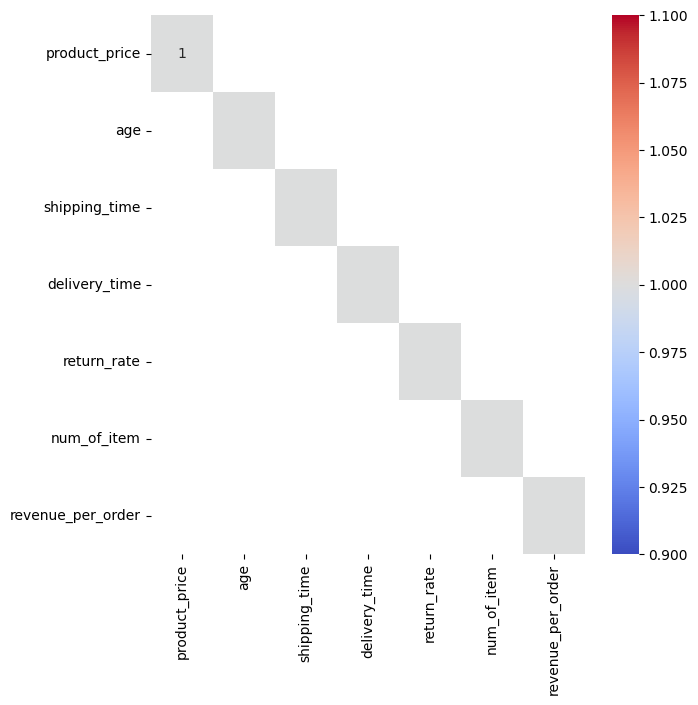

In [927]:
plt.figure(figsize=(7,7))
sns.heatmap(corr[abs(corr)>=0.7],annot=True,cmap='coolwarm')
plt.show()

#### inference:
1. none of the features have correlation greater than 7,  there fore multicollinearity is absent.

#### outlier treatment

In [928]:
features.describe(percentiles=[0.01,0.02,0.05,0.95,0.98,0.99]).T

,count,mean,std,min,1%,2%,5%,50%,95%,98%,99%,max
product_price,43851.0,41.738634,44.343084,0.00,3.367875,4.16583,5.77155,27.680000,121.48414,165.552293,202.783351,661.699080
age,43851.0,40.952998,15.131689,12.00,12.000000,13.00000,15.00000,40.948947,67.00000,69.000000,70.000000,70.000000
shipping_time,43851.0,0.998746,0.815065,0.00,0.000000,0.00000,0.00000,1.000000,2.00000,2.000000,2.000000,2.000000
delivery_time,43851.0,2.012451,1.416672,0.00,0.000000,0.00000,0.00000,2.000000,4.00000,4.000000,4.000000,4.000000
return_rate,43851.0,0.285626,0.451717,0.00,0.000000,0.00000,0.00000,0.000000,1.00000,1.000000,1.000000,1.000000
num_of_item,43851.0,1.454858,0.809457,1.00,1.000000,1.00000,1.00000,1.000000,4.00000,4.000000,4.000000,4.000000
revenue_per_order,43851.0,87.252137,94.422234,0.02,7.060000,8.99000,12.00000,55.540000,260.00000,353.989998,435.635000,1347.289982


In [929]:
lower_end=['product_price','revenue_per_order']
upper_end=['product_price','revenue_per_order']

In [930]:
def ol_treatment_low_end(x):
    x = x.clip(lower = x.quantile(0.01))
    return x

def ol_treatment_upper_end(x):
    x = x.clip(upper = x.quantile(0.99))
    return x

In [935]:
features[lower_end] = features[lower_end].apply(ol_treatment_low_end)
features[upper_end] = features[upper_end].apply(ol_treatment_upper_end)

In [936]:
features.describe(percentiles=[0.01,0.02,0.05,0.95,0.98,0.99]).T

,count,mean,std,min,1%,2%,5%,50%,95%,98%,99%,max
product_price,43851.0,40.826553,38.640841,3.367875,3.368527,4.16583,5.77155,27.680000,121.48414,165.552293,202.780426,202.783351
age,43851.0,40.952998,15.131689,12.000000,12.000000,13.00000,15.00000,40.948947,67.00000,69.000000,70.000000,70.000000
shipping_time,43851.0,0.998746,0.815065,0.000000,0.000000,0.00000,0.00000,1.000000,2.00000,2.000000,2.000000,2.000000
delivery_time,43851.0,2.012451,1.416672,0.000000,0.000000,0.00000,0.00000,2.000000,4.00000,4.000000,4.000000,4.000000
return_rate,43851.0,0.285626,0.451717,0.000000,0.000000,0.00000,0.00000,0.000000,1.00000,1.000000,1.000000,1.000000
num_of_item,43851.0,1.454858,0.809457,1.000000,1.000000,1.00000,1.00000,1.000000,4.00000,4.000000,4.000000,4.000000
revenue_per_order,43851.0,85.366281,82.819627,7.060000,7.070000,8.99000,12.00000,55.540000,260.00000,353.989998,435.312501,435.635000


#### Encoding categorical columns

In [937]:
cat_cols = features.dtypes[features.dtypes=='object'].index
print(cat_cols)

Index(['gender', 'status'], dtype='object')


In [939]:
features['status'].value_counts()

Complete    31326
Returned    12525
Name: status, dtype: int64

In [938]:
features_dum = pd.get_dummies(features,columns=cat_cols,drop_first=True)
print(features_dum.shape)
print(features_dum.columns)

(43851, 9)
Index(['product_price', 'age', 'shipping_time', 'delivery_time', 'return_rate',
       'num_of_item', 'revenue_per_order', 'gender_M', 'status_Returned'],
      dtype='object')


In [942]:
features_dum.dtypes

product_price        float64
age                  float64
shipping_time          int64
delivery_time          int64
return_rate            int32
num_of_item            int64
revenue_per_order    float64
gender_M               uint8
status_Returned        uint8
dtype: object

In [943]:
# selecting independant and dependant features
x = features_dum.drop('revenue_per_order',axis=1)  
y = np.log(features_dum['revenue_per_order'])
print(x.shape)
print(y.shape)
print(type(x))
print(type(y))

(43851, 8)
(43851,)
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>


### APPLYING OLS MODEL

In [944]:
import statsmodels.api as sm  

In [945]:
x1 = x.copy()
y1 = y.copy()
print(x1.shape)
print(y1.shape)

(43851, 8)
(43851,)


In [946]:
x1 = sm.add_constant(x1)
ols_model1 = sm.OLS(y1,x1).fit()
ols_model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      revenue_per_order   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.067
Date:                Wed, 14 Feb 2024   Prob (F-statistic):              0.382
Time:                        10:00:28   Log-Likelihood:                -58560.
No. Observations:               43851   AIC:                         1.171e+05
Df Residuals:                   43843   BIC:                         1.172e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               4.0561      0.018    227.704      0.000       4.021       4.091
product_price       0.0003      0.000      1.855      0.064   -1.45e-05       0.001
age              6.602e-05      0.000      0.227      0.820      -0.001       0.001
shipping_time      -0.0081      0.005     -1.504      0.133      -0.019       0.002
delivery_time       0.0008      0.003      0.252      0.801      -0.005       0.007
return_rate        -0.0021      0.005     -0.430      0.667      -0.012       0.007
num_of_item        -0.0132      0.007     -1.994      0.046      -0.026      -0.000
gender_M           -0.0046      0.009     -0.527      0.598      -0.022       0.013
status_Returned    -0.0021      0.005     -0.430      0.667      -0.012       0.007
==============================================================================
Omnibus:                     1139.198   Durbin-Watson:                   2.017
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              566.760
Skew:                          -0.004   Prob(JB):                    8.50e-124
Kurtosis:                       2.443   Cond. No.                     5.44e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.41e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [947]:
# taking thresh hold as 0.5
print(type(ols_model1.pvalues))
ols_p = ols_model1.pvalues
ols_p

<class 'pandas.core.series.Series'>


const              0.000000
product_price      0.063533
age                0.820138
shipping_time      0.132712
delivery_time      0.801382
return_rate        0.666990
num_of_item        0.046109
gender_M           0.597887
status_Returned    0.666990
dtype: float64

In [949]:
cols_with_high_p = ols_p[ols_p>0.7].index
print(len(cols_with_high_p))
print(cols_with_high_p)

2
Index(['age', 'delivery_time'], dtype='object')


In [950]:
print(ols_model1.rsquared)
print(ols_model1.rsquared_adj)

0.0001703738712569569
1.0740466086178735e-05


#### model performance is extremely bad at OLS showing high multicollinearity thats why we can do ensemble instead of linear regression

In [951]:
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor

In [952]:
from sklearn import ensemble

In [953]:
from sklearn.metrics import *

In [956]:
# selecting independant and dependant features
X = features_dum.drop('revenue_per_order',axis=1)  
Y = features_dum['revenue_per_order']
print(X.shape)
print(Y.shape)
print(type(X))
print(type(Y))

(43851, 8)
(43851,)
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>


In [955]:
# Split data into train and test
from sklearn.model_selection import train_test_split

In [957]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.30,
                                                random_state=42)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(30695, 8)
(13156, 8)
(30695,)
(13156,)


In [961]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.30,
                                                random_state=42)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(30695, 8)
(13156, 8)
(30695,)
(13156,)


In [958]:
def eval_model_regression(ytest,ypred):
    mae = mean_absolute_error(ytest,ypred)
    mse = mean_squared_error(ytest,ypred)
    rmse = mean_squared_error(ytest,ypred,squared=False)
    print('MAE:',mae,'MSE:',mse,'RMSE:',rmse)

def gen_res_regression(model,x_train,x_test,y_train,y_test,ypred,mname):
    train_r2 = model.score(x_train,y_train)
    test_r2 = model.score(x_test,y_test)
    w = eval_model_regression(y_test,ypred)
    res_metrics = {'Train Acc':train_r2,'Test acc':test_r2}
    res = pd.DataFrame(res_metrics, index=[mname]) 
    return res

In [959]:
rfreg = RandomForestRegressor()
rfreg.fit(X_train,Y_train)
ypred_rfreg  = rfreg.predict(X_test)
rfreg_res = gen_res_regression(rfreg,X_train,X_test,Y_train,Y_test,ypred_rfreg,'Random Forest Regressor')
rfreg_res

MAE: 64.67723187512951 MSE: 7606.148678197931 RMSE: 87.21323682903835


,Train Acc,Test acc
Random Forest Regressor,0.841404,-0.110436


In [960]:
# model is extremly overfit

In [962]:
rfreg = RandomForestRegressor()
rfreg.fit(x_train,y_train)
ypred_rfreg  = rfreg.predict(x_test)
rfreg_res = gen_res_regression(rfreg,x_train,x_test,y_train,y_test,ypred_rfreg,'Random Forest Regressor')
rfreg_res

MAE: 64.7699608714836 MSE: 7608.621938074238 RMSE: 87.22741506014171


,Train Acc,Test acc
Random Forest Regressor,0.842009,-0.110797


In [963]:
from sklearn.neighbors import KNeighborsRegressor

In [964]:
knn = KNeighborsRegressor(n_neighbors=10)
knn.fit(X_train,Y_train)
ypred_knn  = knn.predict(X_test)
knn_res = gen_res_regression(knn,X_train,X_test,Y_train,Y_test,ypred_knn,'K-Nearest neighbour')
knn_res

MAE: 63.12481650429585 MSE: 7507.846968909154 RMSE: 86.64783303066012


,Train Acc,Test acc
K-Nearest neighbour,0.089634,-0.096084


In [965]:
xgb_reg = XGBRegressor()
xgb_reg.fit(X_train,Y_train)
ypred_xgbreg = xgb_reg.predict(X_test)
XGBreg_res = gen_res_regression(xgb_reg,X_train,X_test,Y_train,Y_test,ypred_xgbreg,' XG Boost Regressor')
XGBreg_res

MAE: 61.98929096971757 MSE: 7288.945303059019 RMSE: 85.37532022229269


,Train Acc,Test acc
XG Boost Regressor,0.203233,-0.064127


In [967]:
xgb_reg = XGBRegressor()
xgb_reg.fit(x_train,y_train)
ypred_xgbreg = xgb_reg.predict(x_test)
xGBreg_res = gen_res_regression(xgb_reg,x_train,x_test,y_train,y_test,ypred_xgbreg,' XG Boost Regressor')
xGBreg_res

MAE: 61.98929096971757 MSE: 7288.945303059019 RMSE: 85.37532022229269


,Train Acc,Test acc
xG Boost Regressor,0.203233,-0.064127


In [1074]:
from sklearn.ensemble import AdaBoostRegressor
adareg = AdaBoostRegressor(n_estimators=30)
adareg.fit(X_train,Y_train)
ypred_adareg = adareg.predict(X_test)
ADAreg_res = gen_res_regression(adareg,X_train,X_test,Y_train,Y_test,ypred_adareg,'ADABoost Regressor')
ADAreg_res

MAE: 81.98577550635093 MSE: 8976.996971225894 RMSE: 94.74701563229257


,Train Acc,Test acc
ADABoost Regressor,-0.307254,-0.310568


In [ ]:
#### the data considered for generating revenue_per_order is highly overfit and is not able to generate good test results.
#Hyperparameter tuning can be applied to reduce the over fitting.

### KEY POINTS:
1. Order Timelines Analysis:

- Order Creation: Examined the time taken from order creation to shipment to understand the efficiency of order processing.
- Shipping Time: Analyzed the duration between order shipment and delivery to assess the effectiveness of shipping operations.
- Return Time: Investigated the time taken for returned orders to understand the return process efficiency and identify potential areas for improvement.

2. Analysed customer retention rate , AOC, Order frequency check, Order fullfilment rate and Delivery variance .

Suggestions for Improvement:

- Optimize Inventory Management: Implement effective inventory management strategies to ensure adequate stock levels, minimize stockouts, and reduce order processing delays.
- Streamline Order Processing: Automate order processing tasks and workflows to minimize manual errors, streamline operations, and expedite order fulfilment.
- Improve Logistics Efficiency: Enhance logistics and shipping operations by partnering with reliable carriers, optimizing delivery routes, and implementing real-time tracking systems to provide visibility and transparency to customers.